In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.signal import find_peaks_cwt, general_gaussian, fftconvolve
from scipy.ndimage.measurements import center_of_mass
import numpy as np
import cv2
import math
import os
import pickle


%matplotlib inline

In [2]:
import os
os.listdir("camera_cal/")

['calibration1.jpg',
 'calibration10.jpg',
 'calibration11.jpg',
 'calibration12.jpg',
 'calibration13.jpg',
 'calibration14.jpg',
 'calibration15.jpg',
 'calibration16.jpg',
 'calibration17.jpg',
 'calibration18.jpg',
 'calibration19.jpg',
 'calibration2.jpg',
 'calibration20.jpg',
 'calibration3.jpg',
 'calibration4.jpg',
 'calibration5.jpg',
 'calibration6.jpg',
 'calibration7.jpg',
 'calibration8.jpg',
 'calibration9.jpg']

In [3]:
####失真校正


objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

objp = np.zeros((9*6,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

In [4]:
nx = 9 # number of inside corners in x
ny = 6 # number of inside corners in y
myimgs = os.listdir("camera_cal/")
for item in myimgs:
    path="camera_cal/"+item
    img = mpimg.imread(path)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)
    if ret == True:
       
        imgpoints.append(corners)
        objpoints.append(objp)
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        output_file = 'output_images/'+item
        cv2.imwrite(output_file,img)

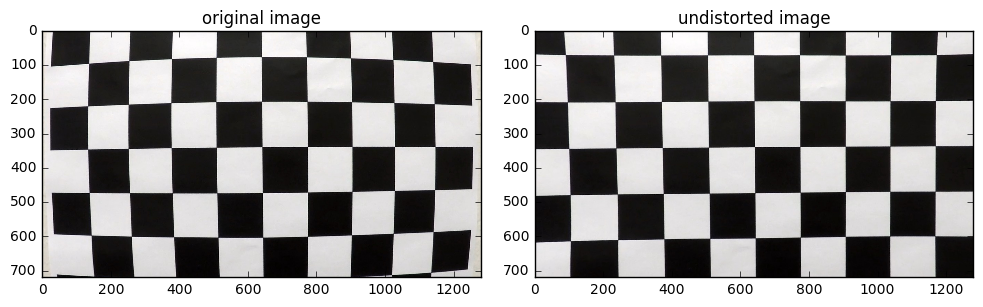

In [6]:
#undistortion on an image
img = mpimg.imread('camera_cal/calibration1.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) # Must read image using mpimg.imread
ret,mtx,dist,rvecs,tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
undist = cv2.undistort(img, mtx, dist, None, mtx)

layout, (plt1, plt2) = plt.subplots(1, 2, figsize=(10, 5))
layout.tight_layout()
plt1.imshow(img)
plt1.set_title('original image')


plt2.imshow(undist)
plt2.set_title('undistorted image')
plt.show()

In [7]:
print('mtx=',mtx)
print('dist=',dist)

mtx= [[  1.15158804e+03   0.00000000e+00   6.66167057e+02]
 [  0.00000000e+00   1.14506859e+03   3.86440204e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
dist= [[ -2.35510339e-01  -7.90388401e-02  -1.28492203e-03   8.25970403e-05
    7.22743173e-02]]


In [8]:
myimgs = os.listdir("camera_cal/")
for item in myimgs:
    path="camera_cal/"+item
    image = mpimg.imread(path)
    
    dst = cv2.undistort(image,mtx,dist,None,mtx)
    output_file='output_images/undistorted_'+item
    cv2.imwrite(output_file,dst)

In [9]:
def draw2Img(img1,img2,title1,title2):
    layout, (plt1, plt2) = plt.subplots(1, 2, figsize=(10, 5))
    layout.tight_layout()
    plt1.imshow(img1)
    plt1.set_title(title1)
    
  
    img2 = np.asarray(img2)
    plt2.imshow(img2)
    plt2.set_title(title2)
    plt.show()


test_images/solidWhiteRight.jpg
output_images/test_images_undistorted_solidWhiteRight.jpg


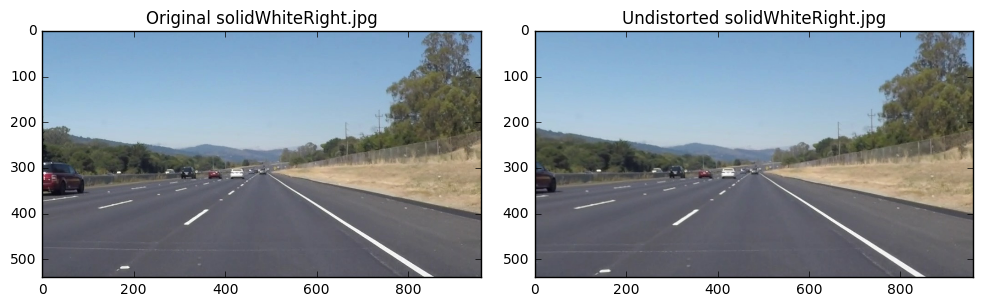

test_images/solidYellowLeft.jpg
output_images/test_images_undistorted_solidYellowLeft.jpg


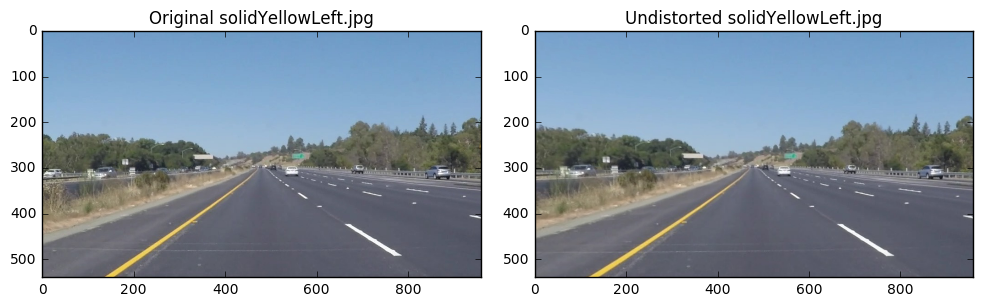

test_images/test1.jpg
output_images/test_images_undistorted_test1.jpg


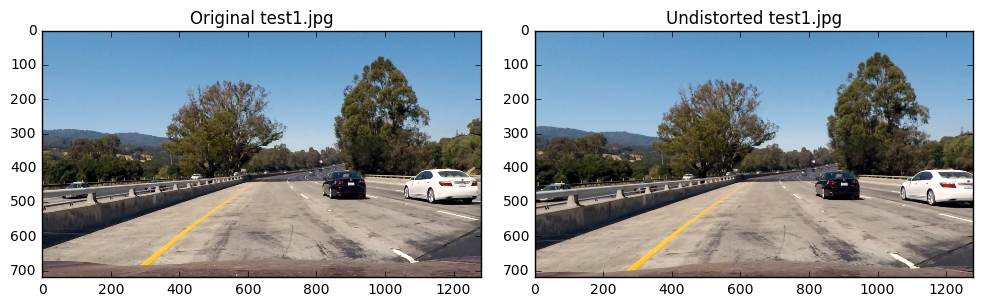

test_images/test2.jpg
output_images/test_images_undistorted_test2.jpg


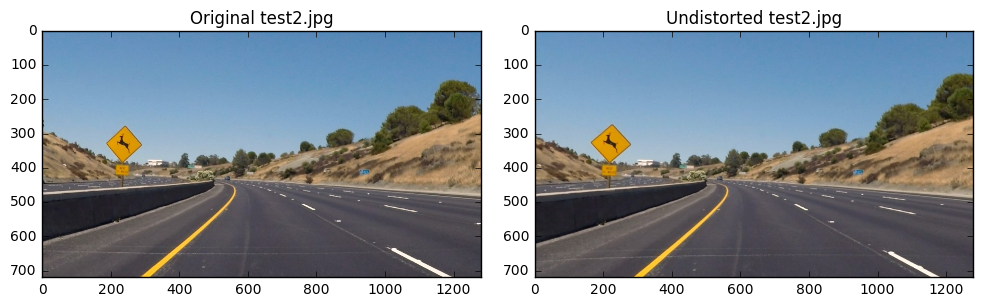

test_images/test3.jpg
output_images/test_images_undistorted_test3.jpg


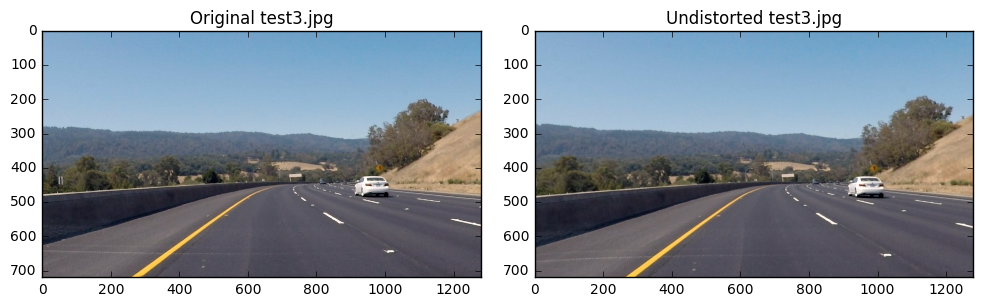

test_images/test4.jpg
output_images/test_images_undistorted_test4.jpg


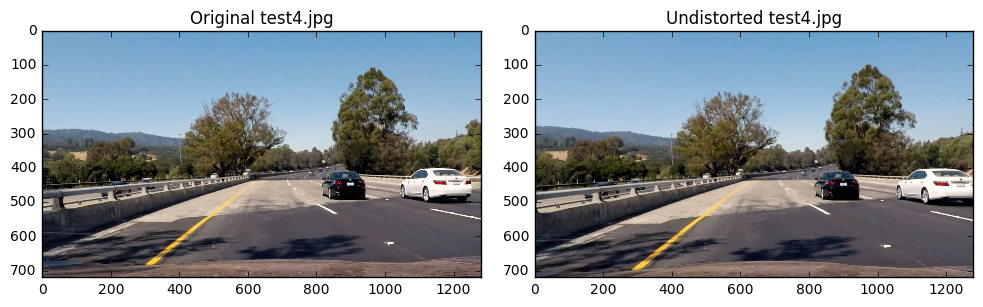

test_images/test5.jpg
output_images/test_images_undistorted_test5.jpg


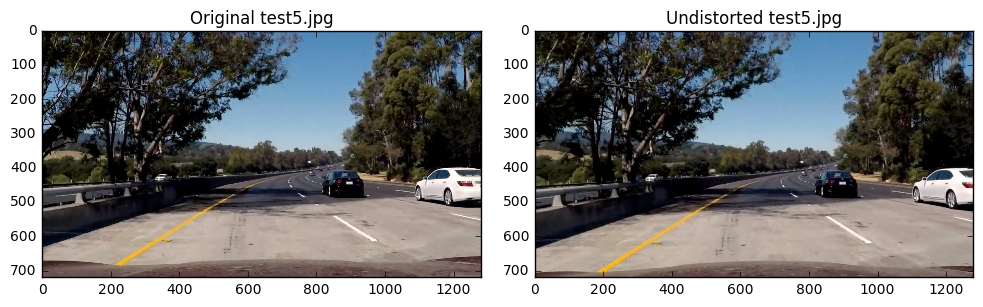

test_images/test6.jpg
output_images/test_images_undistorted_test6.jpg


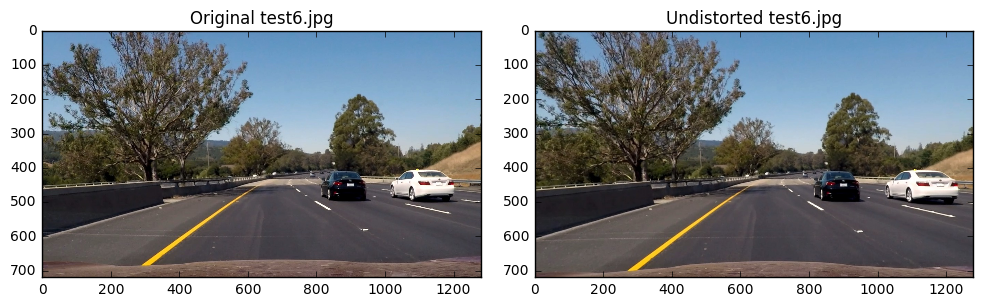

In [10]:
###对原始图像应用失真校正

myimgs = os.listdir("test_images/")
for item in myimgs:
    path="test_images/"+item
    print(path)
    img = mpimg.imread(path)
    dst = cv2.undistort(img,mtx,dist,None,mtx)
    output_file='output_images/test_images_undistorted_'+item
    print(output_file)
    cv2.imwrite(output_file,dst)
    draw2Img(img,dst,'Original '+item,'Undistorted '+item)

In [11]:
########颜色和渐变

def color_and_gradients(imgs,s_gradients_thresh=(20,255),s_thresh=(100,255),l_thresh=(100,255)):
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    img = np.copy(imgs)
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    

    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    #thresh_min = 20
    #thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= s_gradients_thresh[0]) & (scaled_sobel <= s_gradients_thresh[1])] = 1

    # Threshold color channel
    #s_thresh_min = 170
    #s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1 

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = 255*np.dstack(( l_binary, sxbinary, s_binary))

    binary = np.zeros_like(sxbinary)
    binary[((l_binary==1)&(s_binary==1)|(sxbinary==1))] = 1
    binary = 255*np.dstack(( binary, binary, binary))
    return binary,color_binary

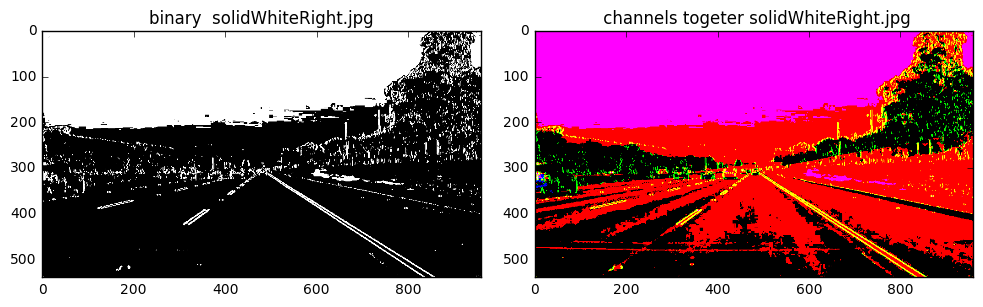

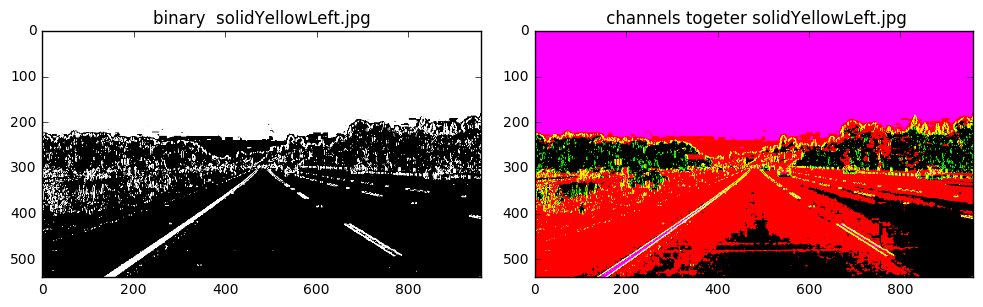

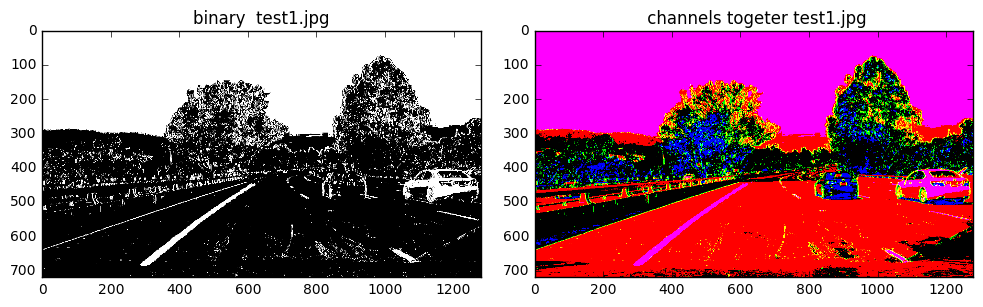

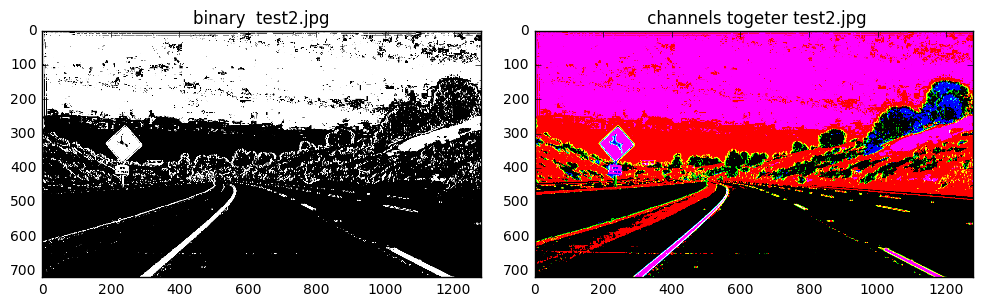

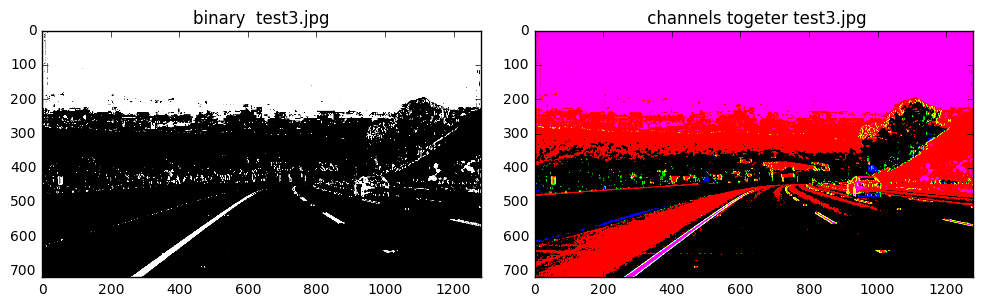

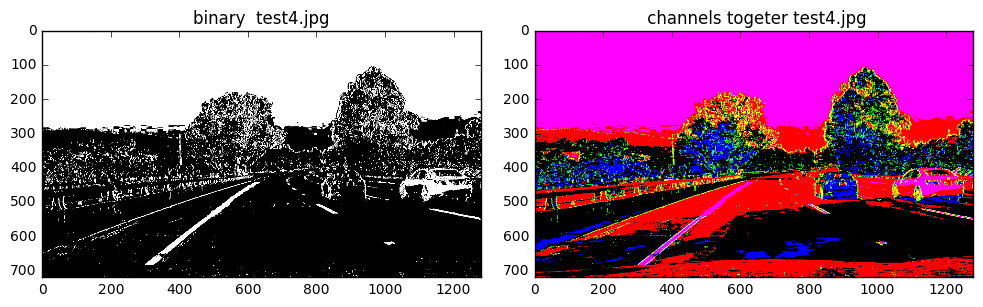

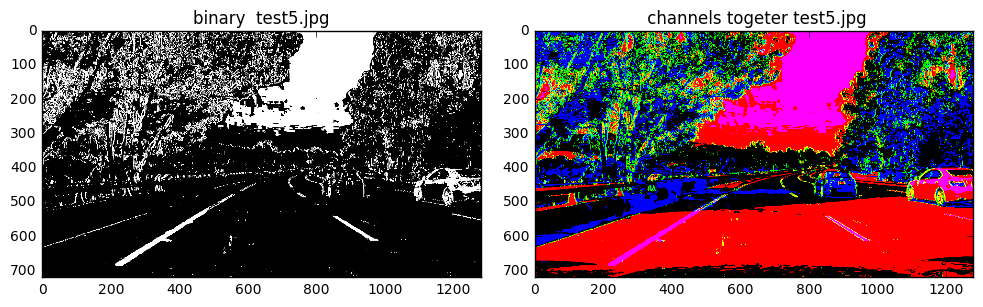

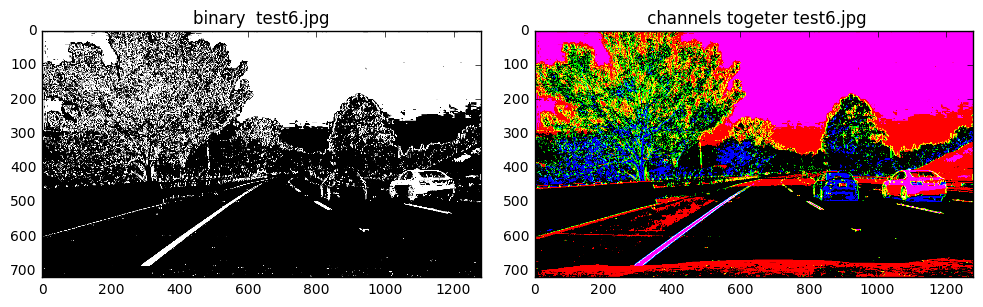

In [12]:

myimgs = os.listdir("test_images/")
for item in myimgs:
    path="test_images/"+item
    image = mpimg.imread(path)
    
    binary,color_binary=color_and_gradients(image)
    # Plotting thresholded images
    draw2Img(binary,color_binary,'binary  '+item,' channels togeter '+item)

In [13]:
#用透视变换来纠正二进制图像（“鸟瞰视图”）
def corners_warp(img):
    corners = np.float32([[190,720],[589,457],[698,457],[1145,720]])
    top_left = np.array([corners[0,0],0])
    top_right = np.array([corners[3,0],0])
    print(top_left)
    print(top_right)
    offset=[150,0]
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Grab the image shape
    img_size = (gray.shape[1], gray.shape[0])

    # For source points I'm grabbing the outer four detected corners
    src = np.float32([corners[0], corners[1], corners[2], corners[3]])
    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    # again, not exact, but close enough for our purposs
    dst = np.float32([corners[0]+offset, top_left+offset, top_right-offset,corners[3]-offset])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size)
    return warped,M

[ 190.    0.]
[ 1145.     0.]


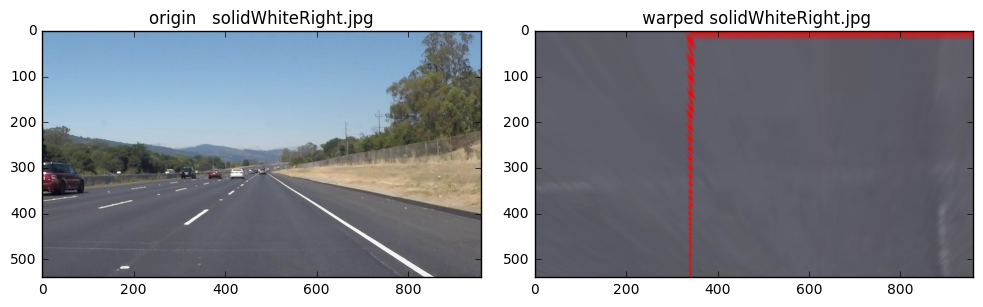

[ 190.    0.]
[ 1145.     0.]


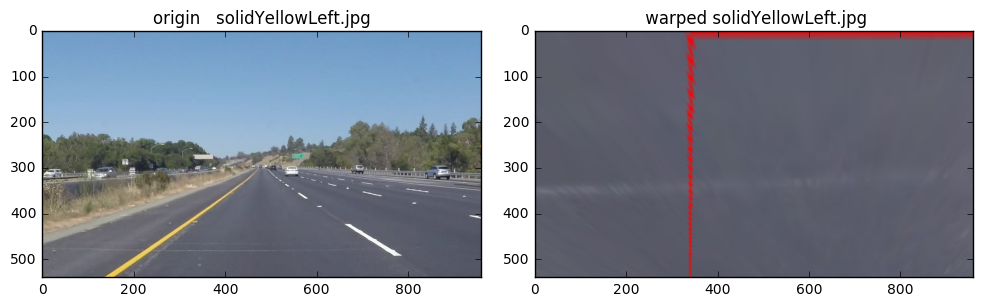

[ 190.    0.]
[ 1145.     0.]


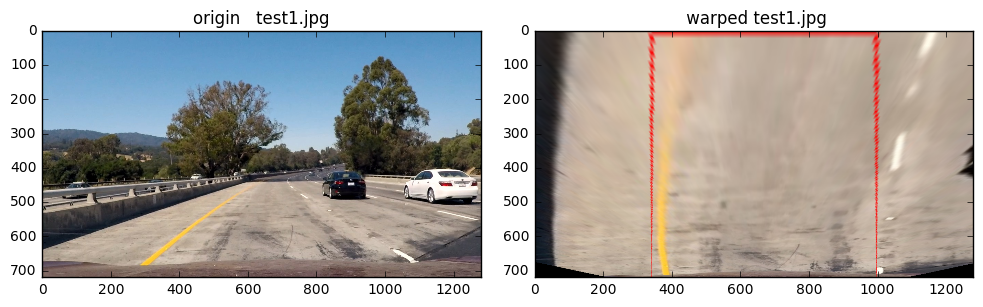

[ 190.    0.]
[ 1145.     0.]


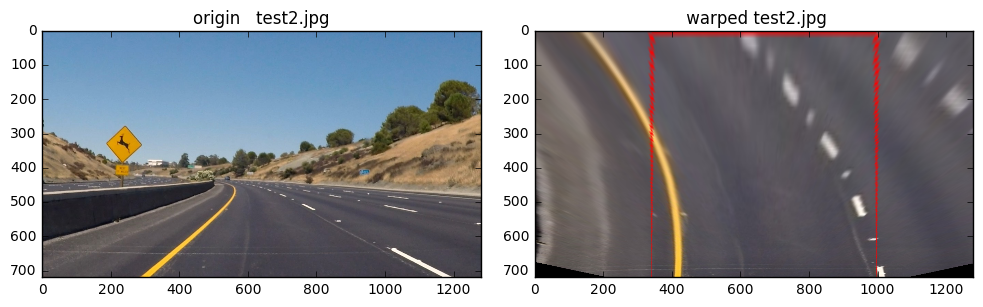

[ 190.    0.]
[ 1145.     0.]


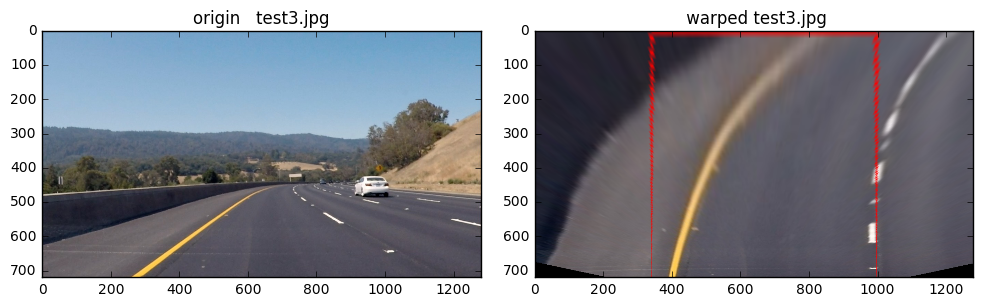

[ 190.    0.]
[ 1145.     0.]


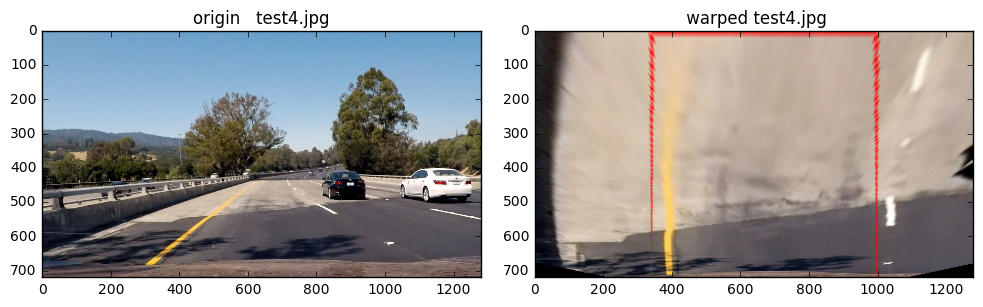

[ 190.    0.]
[ 1145.     0.]


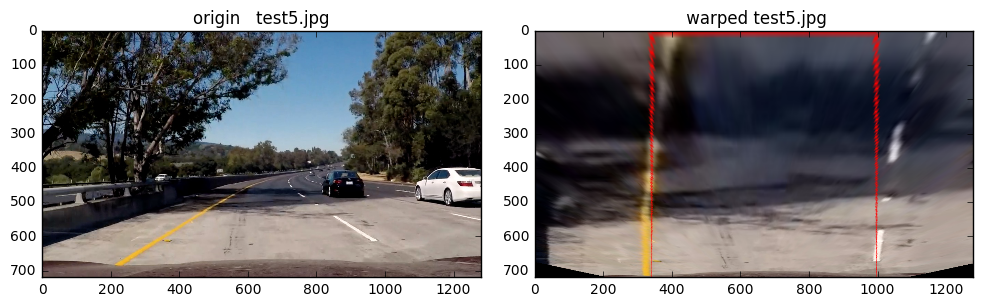

[ 190.    0.]
[ 1145.     0.]


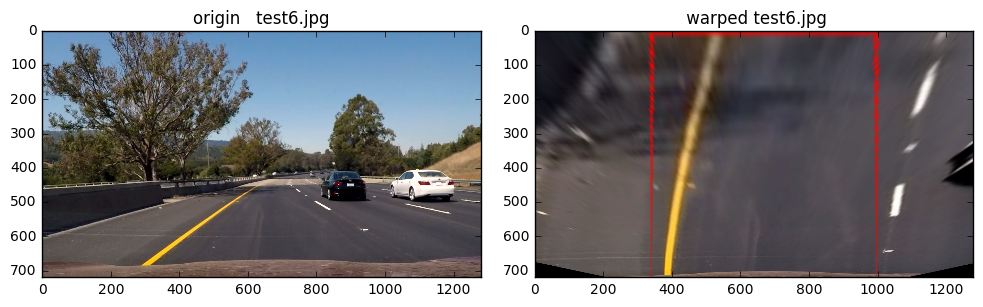

In [14]:
myimgs = os.listdir("test_images/")
for item in myimgs:
    path="test_images/"+item
    image = mpimg.imread(path)
    corners = np.float32([[190,720],[589,457],[698,457],[1145,720]])
    img = cv2.undistort(image,mtx,dist,None,mtx)
    corner_tuples=[]
    for ind,c in enumerate(corners):
        corner_tuples.append(tuple(corners[ind]))

    cv2.line(img, corner_tuples[0], corner_tuples[1], color=[255,0,0], thickness=1)
    cv2.line(img, corner_tuples[1], corner_tuples[2], color=[255,0,0], thickness=1)
    cv2.line(img, corner_tuples[2], corner_tuples[3], color=[255,0,0], thickness=1)
    cv2.line(img, corner_tuples[3], corner_tuples[0], color=[255,0,0], thickness=1)
    
    warped,m =corners_warp(img)
    # Plotting thresholded images
    draw2Img(image,warped,'origin   '+item,' warped '+item)

In [15]:

def region_of_interest(img):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    shape = img.shape
    vertices = np.array([[(0,0),(shape[0], 0), (shape[1],0), (6*shape[1]/7,shape[0]),(shape[1]/7,shape[0]),
                         (0,0)]], dtype=np.int32)
    #vertices = np.array([[imshape[1]*0, imshape[0]],[imshape[1]*0.44, imshape[0]*0.62],[imshape[1]*0.55, imshape[0]*0.62],[imshape[1], imshape[0]]],dtype=np.int32)
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def setundistort(img):
    return cv2.undistort(img,mtx,dist,None,mtx)

def warp_pipelines(img):
    undist = setundistort(img)
    result,m =corners_warp(undist)
    result =region_of_interest(result)
    return result

def warp_binarize_pipeline(img):
    undist =setundistort(img)
    binary,color_binary = color_and_gradients(undist)
    result,m = corners_warp(binary)
    result = region_of_interest(result)
    return result

[ 190.    0.]
[ 1145.     0.]
[ 190.    0.]
[ 1145.     0.]


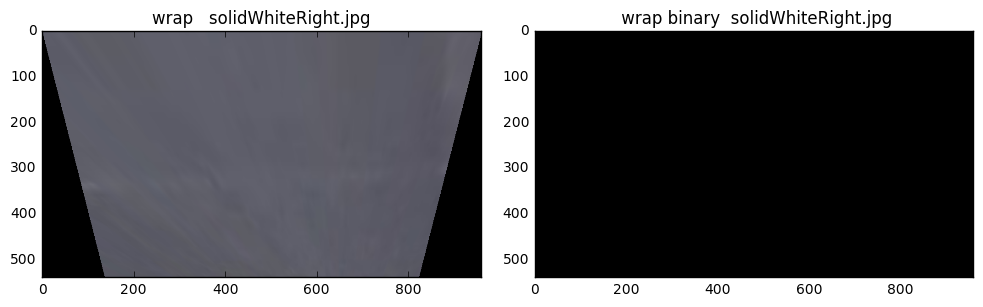

[ 190.    0.]
[ 1145.     0.]
[ 190.    0.]
[ 1145.     0.]


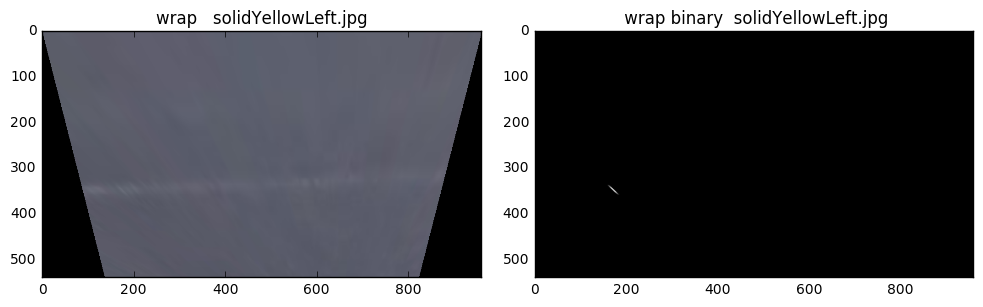

[ 190.    0.]
[ 1145.     0.]
[ 190.    0.]
[ 1145.     0.]


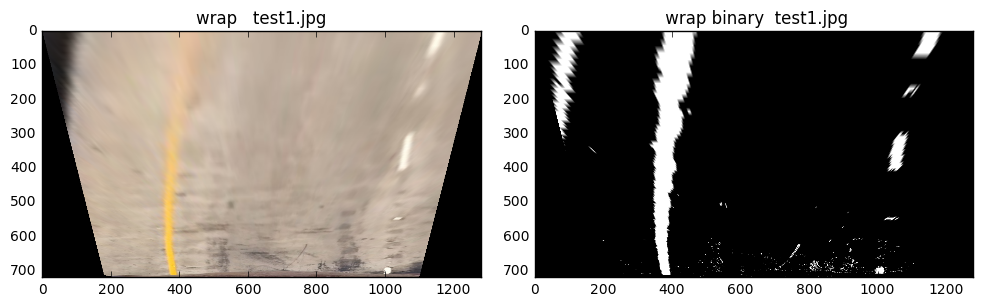

[ 190.    0.]
[ 1145.     0.]
[ 190.    0.]
[ 1145.     0.]


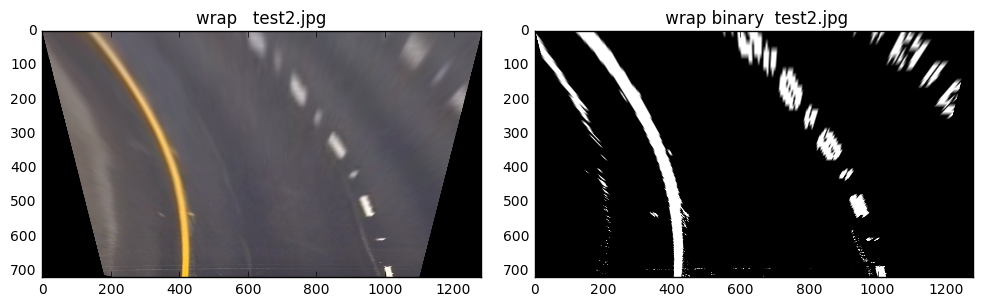

[ 190.    0.]
[ 1145.     0.]
[ 190.    0.]
[ 1145.     0.]


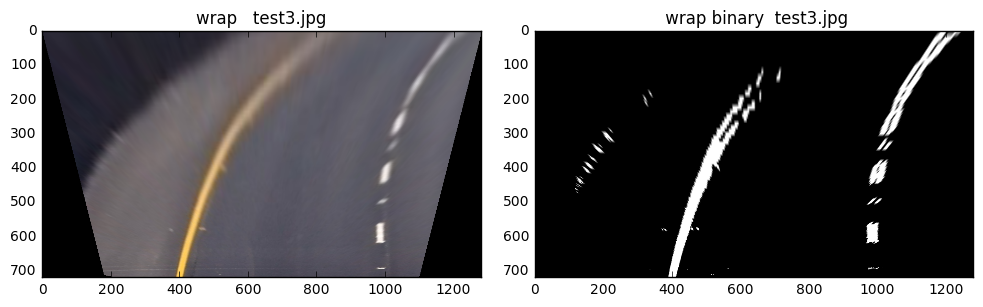

[ 190.    0.]
[ 1145.     0.]
[ 190.    0.]
[ 1145.     0.]


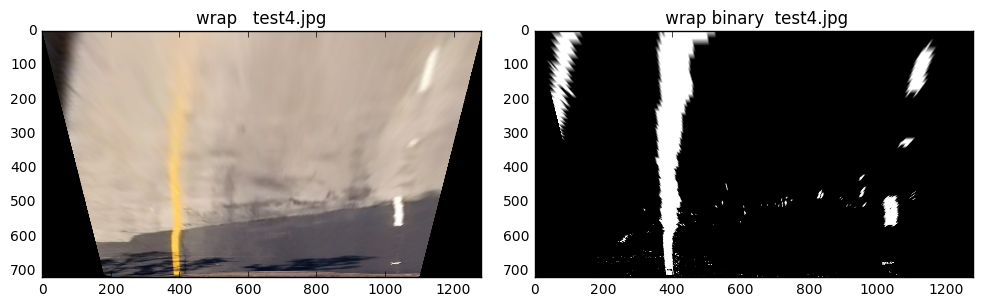

[ 190.    0.]
[ 1145.     0.]
[ 190.    0.]
[ 1145.     0.]


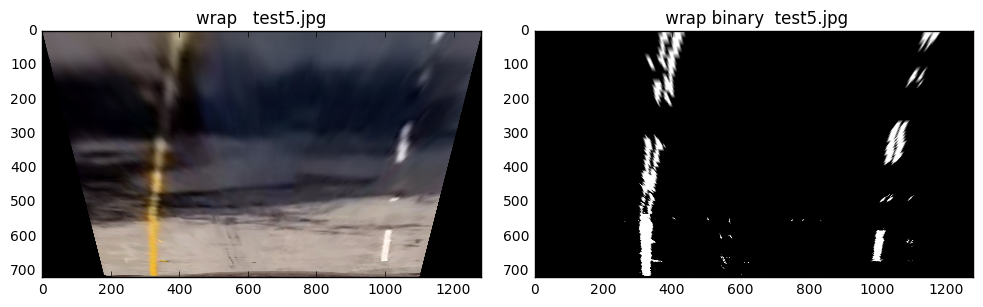

[ 190.    0.]
[ 1145.     0.]
[ 190.    0.]
[ 1145.     0.]


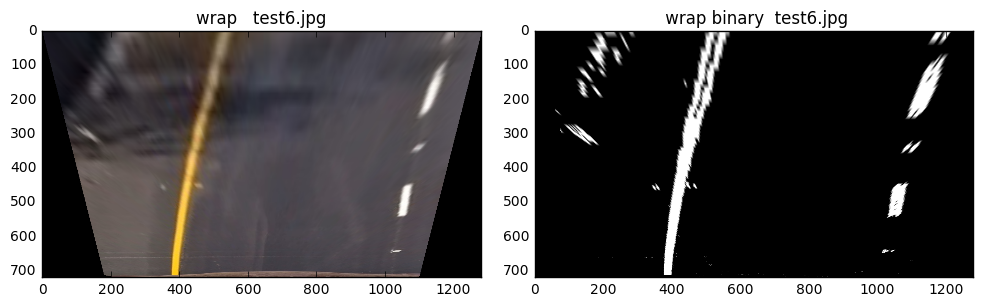

In [16]:
myimgs = os.listdir("test_images/")
for item in myimgs:
    path="test_images/"+item
    image = mpimg.imread(path)

    w =warp_pipelines(image)
    x =warp_binarize_pipeline(image)

    draw2Img(w,x,'wrap   '+item,' wrap binary  '+item)

In [17]:
###透视变换
#透视变换使用新的透视将给定图像中的点映射到不同的期望的图像点。 你最感兴趣的透视变换是一个鸟瞰视图变换，
#让我们从上面查看一个通道; 这将有助于计算后来的车道曲率。 除了创建图像的鸟瞰图表示之外，
#透视变换还可以用于所有种类的不同视点。
#您可能想对图像执行透视变换的原因有很多，但是对于从汽车上的前置摄像头拍摄的道路图像，我们为什么对进行透视变换感兴趣？
##我们要测量车道的曲率，为了做到这一点，我们首先需要转换到车道的自上而下的视图。
#我们要测量车道的曲率，为了做到这一点，我们首先需要转换到车道的自上而下的视图。
def transforms(binary,src,dst):
    size =binary.shape[::-1]
    print(size)
    #
    M = cv2.getPerspectiveTransform(src,dst)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    warped_img = cv2.warpPerspective(binary,M, (binary.shape[1], binary.shape[0]),flags=cv2.INTER_LINEAR)
    return warped_img



(3, 960, 540)


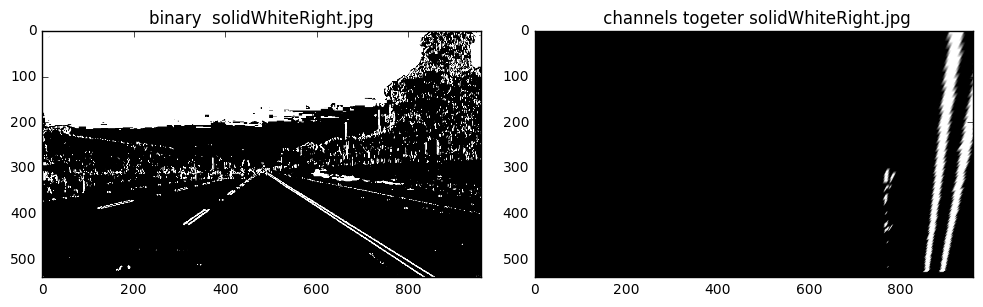

(3, 960, 540)


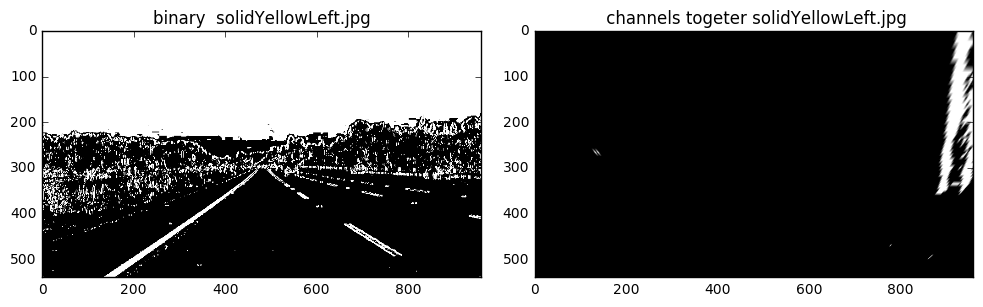

(3, 1280, 720)


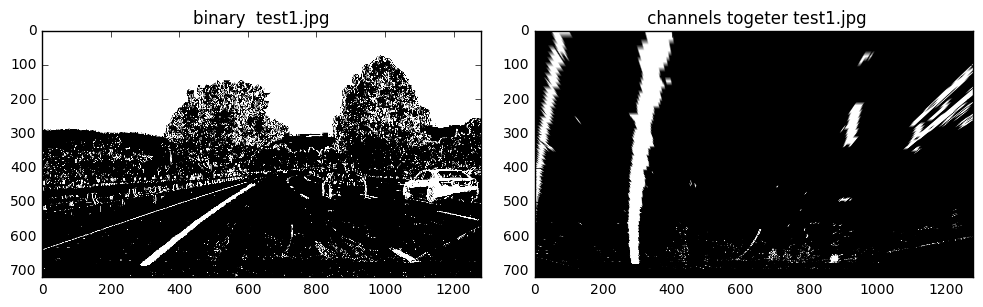

(3, 1280, 720)


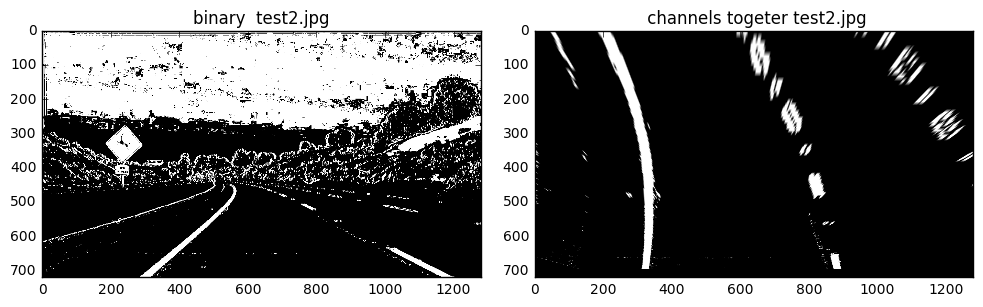

(3, 1280, 720)


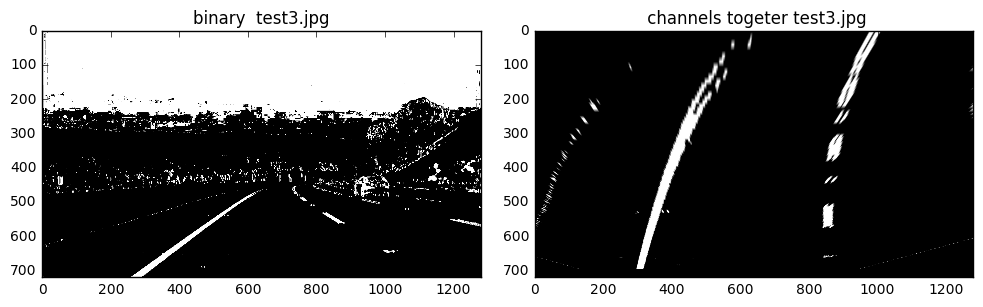

(3, 1280, 720)


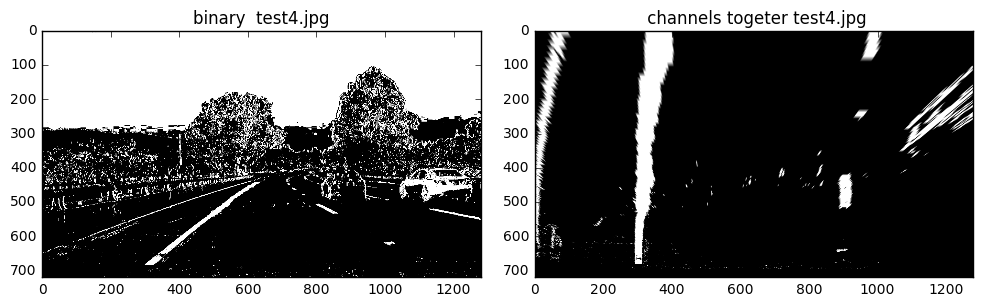

(3, 1280, 720)


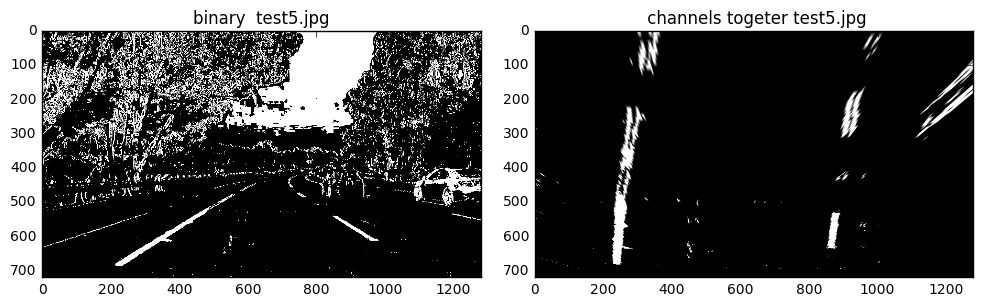

(3, 1280, 720)


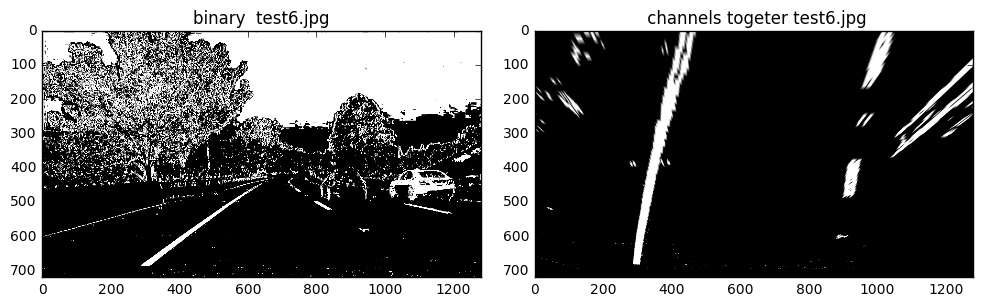

In [18]:
src = np.float32([[258, 679], [446, 549], [837, 549], [1045, 679]])
dst = np.float32([[258, 679], [258, 549], [837, 549], [837, 679]])


myimgs = os.listdir("test_images/")
for item in myimgs:
    path="test_images/"+item
    image = mpimg.imread(path)
    
    binary,color_binary=color_and_gradients(image)
    perspective_transform_img = transforms(binary,src,dst)
    # Plotting thresholded images
    draw2Img(binary,perspective_transform_img,'binary  '+item,' channels togeter '+item)


In [19]:
def binary_threshold(image,c_thresh=(90,255),g_thresh=(200,220)):
    #defining a blank mask to start with
    mask = np.zeros_like(image[:,:,0])
    vertices = np.array([[[182, 720], [500, 466], [782, 464], [1234, 720]]]) # mask
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, (1))
    
    # binarize in C channel, mainly detect yellow lane lines
    c_channel = np.max(image,axis=2)-np.min(image,axis=2)
    _,c_binary = cv2.threshold(c_channel,c_thresh[0],c_thresh[1],cv2.THRESH_BINARY)

    # binarize in gray channel, mainly detect white lane lines
    gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    _, gray_binary = cv2.threshold(gray,g_thresh[0],g_thresh[1],cv2.THRESH_BINARY)
    
    # combine the results
    combined_binary_masked = cv2.bitwise_and(cv2.bitwise_or(c_binary,gray_binary),mask)
    
    return combined_binary_masked

In [20]:
def draw2Imggary(img1,img2,title1,title2):
    layout, (plt1, plt2) = plt.subplots(1, 2, figsize=(10, 5))
    layout.tight_layout()
    plt1.imshow(img1,cmap='gray')
    plt1.set_title(title1)
    
  
    img2 = np.asarray(img2)
    plt2.imshow(img2,cmap='gray')
    plt2.set_title(title2)
    plt.show()


(960, 540)


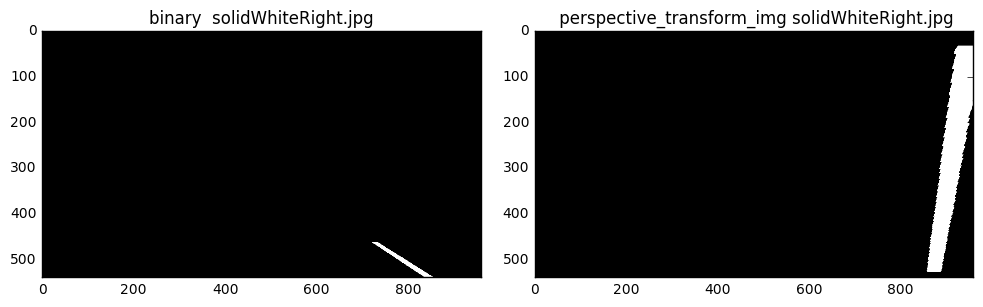

(960, 540)


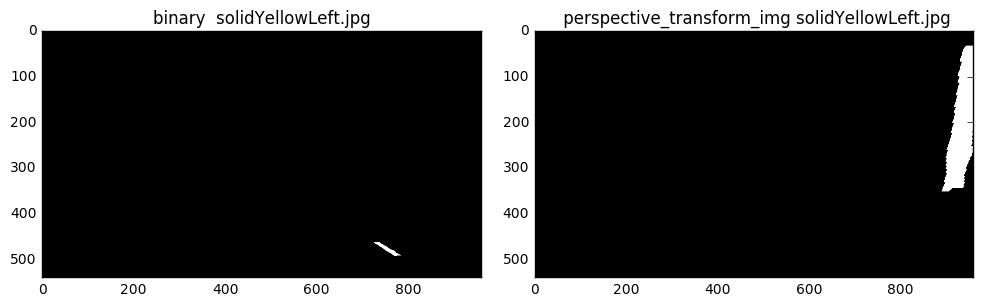

(1280, 720)


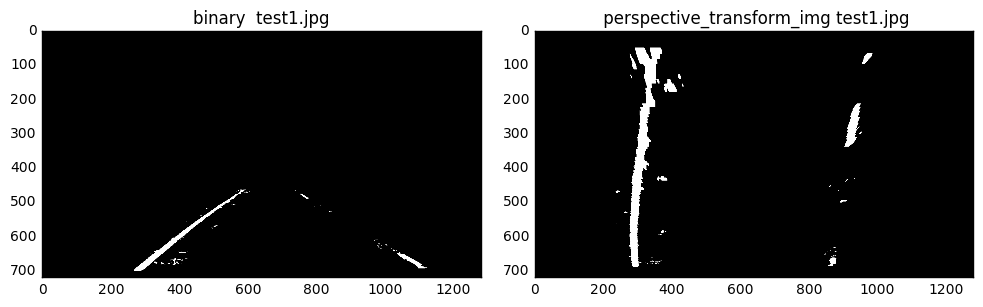

(1280, 720)


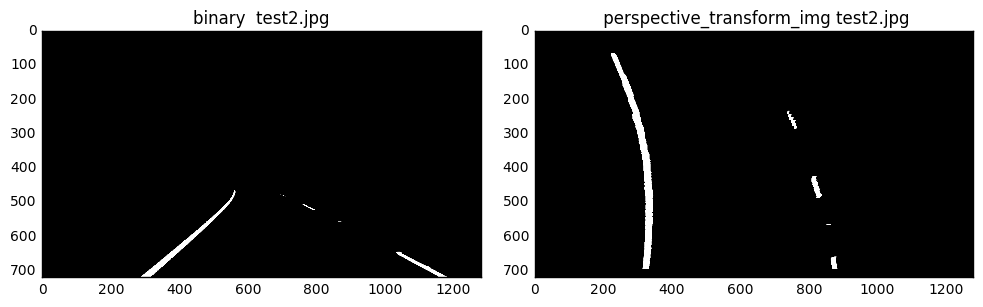

(1280, 720)


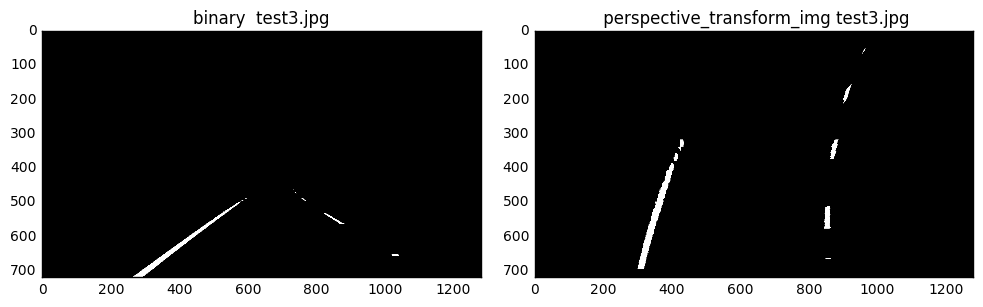

(1280, 720)


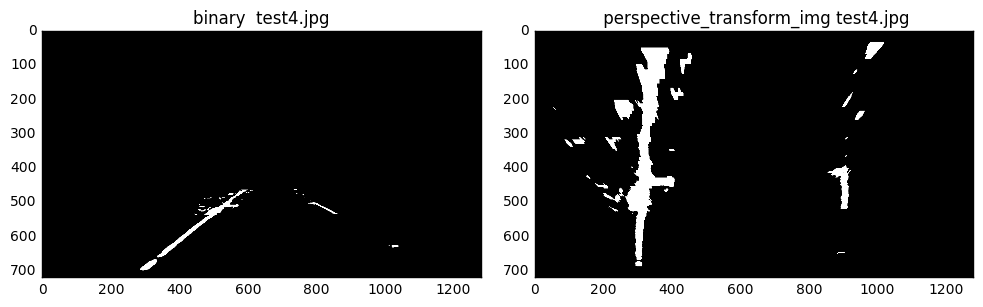

(1280, 720)


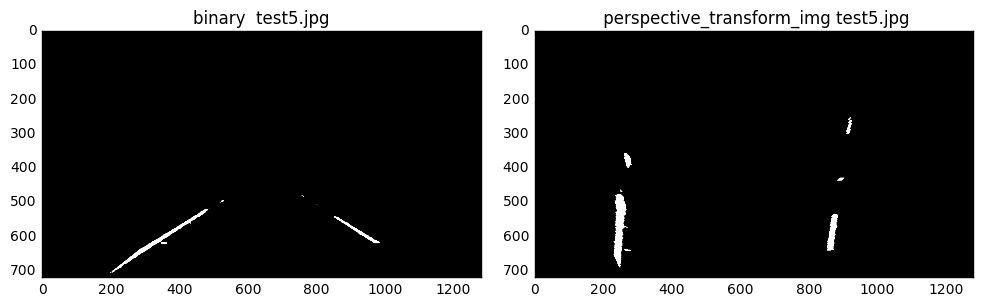

(1280, 720)


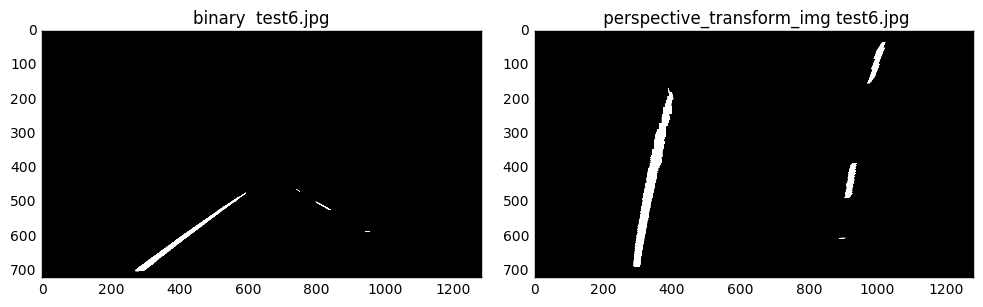

In [21]:
myimgs = os.listdir("test_images/")
for item in myimgs:
    path="test_images/"+item
    image = mpimg.imread(path)
    image =setundistort(image)
    binary=binary_threshold(image,g_thresh=(200,217))
    perspective_transform_img = transforms(binary,src,dst)
    # Plotting thresholded images
    draw2Imggary(binary,perspective_transform_img,'binary  '+item,' perspective_transform_img '+item)

In [22]:
###选择左车道和又车道

########################




In [23]:

from scipy.signal import find_peaks_cwt, general_gaussian, fftconvolve
from scipy.ndimage.measurements import center_of_mass
def select_lane_lines(warped_lane,sliding_window = [80,120]):
    """select pixels that are lane lines"""

    def gaussian_smooth(data):
        window = general_gaussian(51, p=0.5, sig=20)
        filtered = fftconvolve(window, data)
        filtered = (np.average(data) / np.average(filtered)) * filtered
        filtered = np.roll(filtered, -25)
        return filtered[0:len(data)]

    
    window_width = sliding_window[0]
    window_height = sliding_window[1]
    
    # histogram of the lower half of the image
    histogram = np.sum(warped_lane[warped_lane.shape[0]//2:,:], axis=0)
    histogram_smoothed = gaussian_smooth(histogram)
    
    # find the peaks from the smoothed curve
    peakidx = find_peaks_cwt(histogram_smoothed, np.arange(90,100))
    
    # if more than two peaks found, report the error
    if len(peakidx) != 2:
        print('peakidx len is {}'.format(peakidx))
    
    # slidding window
    left_windows = []
    right_windows = []
    current_left_window = [peakidx[0]-window_width,peakidx[0]+window_width]
    current_right_window = [peakidx[1]-window_width,peakidx[1]+window_width]

    for i in range(6):
        # update current sliding window according to the center of mass in the current window 
        current_height_window = [720-(i+1)*window_height, 720-i*window_height]
        left_lane_windowed = warped_lane[current_height_window[0]:current_height_window[1], current_left_window[0]:current_left_window[1]]
        right_lane_windowed = warped_lane[current_height_window[0]:current_height_window[1], current_right_window[0]:current_right_window[1]]
        hist_left = np.sum(left_lane_windowed, axis=0)
        hist_right = np.sum(right_lane_windowed, axis=0)
        # if there is no pixels in the current window, skip the updating
        if not all(hist_left==0):
            center_left = int(center_of_mass(hist_left)[0]) + current_left_window[0]
            current_left_window = [center_left-window_width,center_left+window_width]
        if not all(hist_right==0):    
            center_right = int(center_of_mass(hist_right)[0]) + current_right_window[0]
            current_right_window = [center_right-window_width,center_right+window_width]
        # record the current window
        left_windows.append([current_height_window,current_left_window])
        right_windows.append([current_height_window,current_right_window])
    
    left_window_binary = np.zeros_like(warped_lane)
    right_window_binary = np.zeros_like(warped_lane)
    for wd in left_windows:
        xmin = wd[0][0]
        xmax = wd[0][1]
        ymin = wd[1][0]
        ymax = wd[1][1]
        left_window_binary[xmin:xmax,ymin:ymax] = 1
    
    for wd in right_windows:
        xmin = wd[0][0]
        xmax = wd[0][1]
        ymin = wd[1][0]
        ymax = wd[1][1]
        right_window_binary[xmin:xmax,ymin:ymax] = 1
    
    # select only the pixels in the sliding window
    left_lane_binary = np.zeros_like(warped_lane)
    left_lane_binary[(left_window_binary==1) & (warped_lane==1)]=1
    right_lane_binary = np.zeros_like(warped_lane)
    right_lane_binary[(right_window_binary==1) & (warped_lane==1)]=1
    
    return [left_lane_binary,right_lane_binary]

(1280, 720)


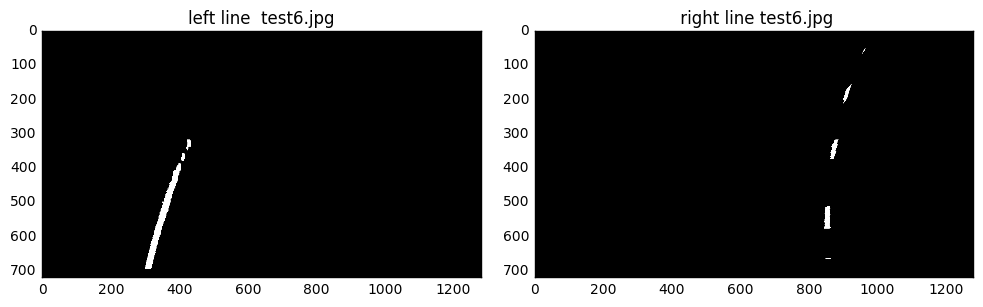

In [24]:

path="test_images/"+myimgs[4]
image = mpimg.imread(path)
image =setundistort(image)
binary=binary_threshold(image,g_thresh=(200,217))
perspective_transform_img = transforms(binary,src,dst)
left_lane, right_lane = select_lane_lines(perspective_transform_img)
# Plotting thresholded images
draw2Imggary(left_lane,right_lane,'left line  '+item,' right line '+item)


In [25]:

def fit_lane_line(lr_binary_images):
    """fit the left and right lane lines, return the quadratic coefficients"""
    left_lane_binary = lr_binary_images[0]
    right_lane_binary = lr_binary_images[1]
    
    # fit the left and right lane pixels 
    left_Y,left_X = np.where(left_lane_binary==1)
    left_fit = np.polyfit(left_Y, left_X, 2)
    left_fitx = left_fit[0]*left_Y**2 + left_fit[1]*left_Y + left_fit[2]

    right_Y,right_X = np.where(right_lane_binary==1)
    right_fit = np.polyfit(right_Y, right_X, 2)
    right_fitx = right_fit[0]*right_Y**2 + right_fit[1]*right_Y + right_fit[2]
    
    return [left_fit,right_fit]



(1280, 720)


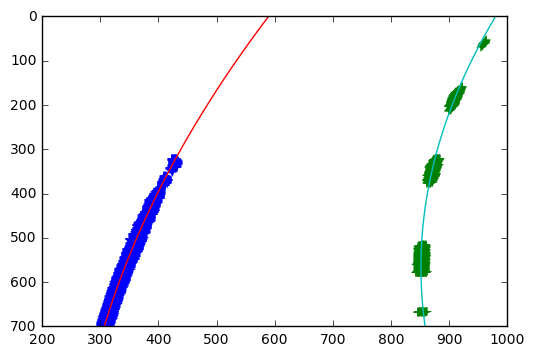

In [26]:
def drawLine(left_lane,right_lane,left_fit,right_fit):
    yval = np.linspace(0,700)

    left_Y,left_X = np.where(left_lane==1)
    left_fitx = left_fit[0]*yval**2 + left_fit[1]*yval + left_fit[2]

    right_Y,right_X = np.where(right_lane==1)
    right_fitx = right_fit[0]*yval**2 + right_fit[1]*yval + right_fit[2]

    plt.plot(left_X,left_Y,'+')
    plt.plot(right_X,right_Y,'+')
    plt.plot(left_fitx,yval)
    plt.plot(right_fitx,yval)
    plt.gca().invert_yaxis()


path="test_images/"+myimgs[4]
image = mpimg.imread(path)
image =setundistort(image)
binary=binary_threshold(image,g_thresh=(200,217))
perspective_transform_img = transforms(binary,src,dst)
left_lane, right_lane = select_lane_lines(perspective_transform_img)
left_fit,right_fit = fit_lane_line([left_lane,right_lane])
drawLine(left_lane,right_lane,left_fit,right_fit)
   
    

In [27]:
def getRadiusDeviations(lr_binary_images):
    
    y_eval = 720
    
    left_lane_binary = lr_binary_images[0]
    right_lane_binary = lr_binary_images[1]
    
    lefty,leftx = np.where(left_lane_binary==1)
    righty,rightx = np.where(right_lane_binary==1)

    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters

    radius = (left_curverad + right_curverad)/2.
    
    # fit polynomials in pixel space
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # left right lane position
    left_lane_pos  = left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2]
    right_lane_pos = right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2]
    
    # diviate from center in meters
    deviation = ((right_lane_pos + left_lane_pos)/2. - 1280/2.)*xm_per_pix
    
    return [radius, deviation]

radius, deviation = getRadiusDeviations([left_lane,right_lane])

In [28]:
def addWeight_img(image,left_right_fits,src,dst):
 
    Minv = cv2.getPerspectiveTransform(dst,src) 
    
    left_fit = left_right_fits[0]
    right_fit = left_right_fits[1]
    
    # # Define y-value where we want radius of curvature
    yval = np.linspace(0,700)

    
    # left and right x values
    left_fitx = left_fit[0]*yval**2 + left_fit[1]*yval + left_fit[2]
    right_fitx = right_fit[0]*yval**2 + right_fit[1]*yval + right_fit[2]
    
    
    color_warp = np.zeros_like(image).astype(np.uint8)
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yval]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yval])))])
    pts = np.hstack((pts_left, pts_right))


    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0]))
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    return result



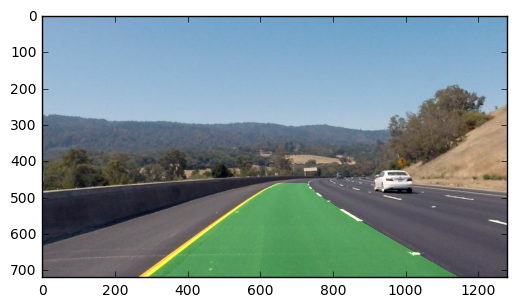

In [29]:
plt.imshow(addWeight_img(image,[left_fit,right_fit],src,dst))

In [30]:
def addText(image,radius,deviation):
    cv2.putText(image, "radius    : {} m".format(int(radius)), (440,80), cv2.FONT_HERSHEY_SIMPLEX, 2, (225,225,225), 2, cv2.LINE_AA)
    cv2.putText(image, "deviation : {0:.2f} m".format(deviation), (440,130), cv2.FONT_HERSHEY_SIMPLEX, 2, (225,225,225), 2, cv2.LINE_AA)
    cv2.putText(image,"author:kangfei",(440,630), cv2.FONT_HERSHEY_SIMPLEX, 2, (225,225,225), 2, cv2.LINE_AA)
    return image


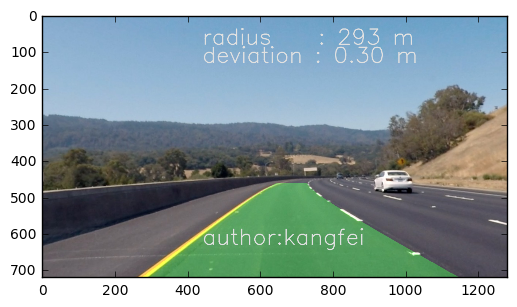

In [33]:
i2 = addWeight_img(image,[left_fit,right_fit],src,dst)
plt.imshow(addText(i2,radius,deviation))

In [34]:
def pipeline (img):
    image = np.copy(img)
    image =setundistort(image)
    binary=binary_threshold(image,g_thresh=(200,217))
    perspective_transform_img = transforms(binary,src,dst)
    left_lane, right_lane = select_lane_lines(perspective_transform_img)
    left_fit,right_fit = fit_lane_line([left_lane,right_lane])
    radius, deviation = getRadiusDeviations([left_lane,right_lane])
    i2 = addWeight_img(image,[left_fit,right_fit],src,dst)
    result=addText(i2,radius,deviation)
    return result
  

In [35]:
from moviepy.editor import VideoFileClip

project_video_output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
lane_clip = clip1.fl_image(pipeline) 
%time lane_clip.write_videofile(project_video_output, audio=False)

(1280, 720)
[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


  0%|                                                 | 0/1261 [00:00<?, ?it/s]

(1280, 720)


  0%|                                         | 1/1261 [00:00<02:09,  9.73it/s]

(1280, 720)


  0%|                                         | 2/1261 [00:00<02:14,  9.37it/s]

(1280, 720)


  0%|                                         | 3/1261 [00:00<02:17,  9.12it/s]

(1280, 720)


  0%|▏                                        | 4/1261 [00:00<02:20,  8.92it/s]

(1280, 720)


  0%|▏                                        | 5/1261 [00:00<02:20,  8.95it/s]

(1280, 720)


  0%|▏                                        | 6/1261 [00:00<02:24,  8.69it/s]

(1280, 720)


  1%|▏                                        | 7/1261 [00:00<02:30,  8.32it/s]

(1280, 720)


  1%|▎                                        | 8/1261 [00:00<02:27,  8.47it/s]

(1280, 720)


  1%|▎                                        | 9/1261 [00:01<02:26,  8.55it/s]

(1280, 720)


  1%|▎                                       | 10/1261 [00:01<02:24,  8.67it/s]

(1280, 720)


  1%|▎                                       | 11/1261 [00:01<02:23,  8.73it/s]

(1280, 720)
(1280, 720)


  1%|▍                                       | 13/1261 [00:01<02:21,  8.81it/s]

(1280, 720)


  1%|▍                                       | 14/1261 [00:01<02:19,  8.93it/s]

(1280, 720)


  1%|▍                                       | 15/1261 [00:01<02:21,  8.79it/s]

(1280, 720)


  1%|▌                                       | 16/1261 [00:01<02:22,  8.71it/s]

(1280, 720)


  1%|▌                                       | 17/1261 [00:01<02:23,  8.68it/s]

(1280, 720)


  1%|▌                                       | 18/1261 [00:02<02:23,  8.65it/s]

(1280, 720)
(1280, 720)


  2%|▋                                       | 20/1261 [00:02<02:20,  8.81it/s]

(1280, 720)


  2%|▋                                       | 21/1261 [00:02<02:21,  8.75it/s]

(1280, 720)


  2%|▋                                       | 22/1261 [00:02<02:21,  8.75it/s]

(1280, 720)


  2%|▋                                       | 23/1261 [00:02<02:20,  8.80it/s]

(1280, 720)


  2%|▊                                       | 24/1261 [00:02<02:16,  9.05it/s]

(1280, 720)


  2%|▊                                       | 25/1261 [00:02<02:18,  8.91it/s]

(1280, 720)


  2%|▊                                       | 26/1261 [00:02<02:21,  8.73it/s]

(1280, 720)


  2%|▊                                       | 27/1261 [00:03<02:16,  9.06it/s]

(1280, 720)


  2%|▉                                       | 28/1261 [00:03<02:18,  8.90it/s]

(1280, 720)


  2%|▉                                       | 29/1261 [00:03<02:19,  8.81it/s]

(1280, 720)


  2%|▉                                       | 30/1261 [00:03<02:20,  8.73it/s]

(1280, 720)


  2%|▉                                       | 31/1261 [00:03<02:21,  8.67it/s]

(1280, 720)


  3%|█                                       | 32/1261 [00:03<02:22,  8.62it/s]

(1280, 720)


  3%|█                                       | 33/1261 [00:03<02:21,  8.66it/s]

(1280, 720)


  3%|█                                       | 34/1261 [00:03<02:16,  8.99it/s]

(1280, 720)


  3%|█                                       | 35/1261 [00:03<02:18,  8.87it/s]

(1280, 720)


  3%|█▏                                      | 36/1261 [00:04<02:19,  8.78it/s]

(1280, 720)


  3%|█▏                                      | 37/1261 [00:04<02:14,  9.11it/s]

(1280, 720)


  3%|█▏                                      | 38/1261 [00:04<02:19,  8.77it/s]

(1280, 720)


  3%|█▏                                      | 39/1261 [00:04<02:21,  8.65it/s]

(1280, 720)


  3%|█▎                                      | 40/1261 [00:04<02:27,  8.30it/s]

(1280, 720)


  3%|█▎                                      | 41/1261 [00:04<02:27,  8.27it/s]

(1280, 720)


  3%|█▎                                      | 42/1261 [00:04<02:25,  8.35it/s]

(1280, 720)


  3%|█▎                                      | 43/1261 [00:04<02:25,  8.37it/s]

(1280, 720)


  3%|█▍                                      | 44/1261 [00:05<02:18,  8.80it/s]

(1280, 720)


  4%|█▍                                      | 45/1261 [00:05<02:19,  8.74it/s]

(1280, 720)


  4%|█▍                                      | 46/1261 [00:05<02:19,  8.72it/s]

(1280, 720)


  4%|█▍                                      | 47/1261 [00:05<02:18,  8.75it/s]

(1280, 720)


  4%|█▌                                      | 48/1261 [00:05<02:15,  8.95it/s]

(1280, 720)


  4%|█▌                                      | 49/1261 [00:05<02:17,  8.80it/s]

(1280, 720)
(1280, 720)


  4%|█▌                                      | 51/1261 [00:05<02:15,  8.95it/s]

(1280, 720)


  4%|█▋                                      | 52/1261 [00:05<02:17,  8.79it/s]

(1280, 720)


  4%|█▋                                      | 53/1261 [00:06<02:17,  8.79it/s]

(1280, 720)


  4%|█▋                                      | 54/1261 [00:06<02:17,  8.76it/s]

(1280, 720)


  4%|█▋                                      | 55/1261 [00:06<02:18,  8.69it/s]

(1280, 720)


  4%|█▊                                      | 56/1261 [00:06<02:22,  8.47it/s]

(1280, 720)


  5%|█▊                                      | 57/1261 [00:06<02:22,  8.43it/s]

(1280, 720)


  5%|█▊                                      | 58/1261 [00:06<02:18,  8.69it/s]

(1280, 720)


  5%|█▊                                      | 59/1261 [00:06<02:18,  8.67it/s]

(1280, 720)


  5%|█▉                                      | 60/1261 [00:06<02:13,  9.00it/s]

(1280, 720)


  5%|█▉                                      | 61/1261 [00:06<02:15,  8.86it/s]

(1280, 720)


  5%|█▉                                      | 62/1261 [00:07<02:20,  8.52it/s]

(1280, 720)


  5%|█▉                                      | 63/1261 [00:07<02:15,  8.83it/s]

(1280, 720)


  5%|██                                      | 64/1261 [00:07<02:19,  8.58it/s]

(1280, 720)


  5%|██                                      | 65/1261 [00:07<02:20,  8.49it/s]

(1280, 720)


  5%|██                                      | 66/1261 [00:07<02:20,  8.53it/s]

(1280, 720)


  5%|██▏                                     | 67/1261 [00:07<02:17,  8.66it/s]

(1280, 720)


  5%|██▏                                     | 68/1261 [00:07<02:16,  8.72it/s]

(1280, 720)


  5%|██▏                                     | 69/1261 [00:07<02:16,  8.72it/s]

(1280, 720)


  6%|██▏                                     | 70/1261 [00:08<02:16,  8.74it/s]

(1280, 720)


  6%|██▎                                     | 71/1261 [00:08<02:14,  8.83it/s]

(1280, 720)


  6%|██▎                                     | 72/1261 [00:08<02:14,  8.86it/s]

(1280, 720)


  6%|██▎                                     | 73/1261 [00:08<02:13,  8.91it/s]

(1280, 720)


  6%|██▎                                     | 74/1261 [00:08<02:15,  8.76it/s]

(1280, 720)


  6%|██▍                                     | 75/1261 [00:08<02:14,  8.83it/s]

(1280, 720)


  6%|██▍                                     | 76/1261 [00:08<02:12,  8.93it/s]

(1280, 720)


  6%|██▍                                     | 77/1261 [00:08<02:12,  8.94it/s]

(1280, 720)


  6%|██▍                                     | 78/1261 [00:08<02:15,  8.76it/s]

(1280, 720)


  6%|██▌                                     | 79/1261 [00:09<02:10,  9.06it/s]

(1280, 720)


  6%|██▌                                     | 80/1261 [00:09<02:18,  8.55it/s]

(1280, 720)


  6%|██▌                                     | 81/1261 [00:09<02:17,  8.59it/s]

(1280, 720)


  7%|██▌                                     | 82/1261 [00:09<02:15,  8.69it/s]

(1280, 720)


  7%|██▋                                     | 83/1261 [00:09<02:12,  8.89it/s]

(1280, 720)


  7%|██▋                                     | 84/1261 [00:09<02:13,  8.79it/s]

(1280, 720)


  7%|██▋                                     | 85/1261 [00:09<02:13,  8.79it/s]

(1280, 720)


  7%|██▋                                     | 86/1261 [00:09<02:15,  8.66it/s]

(1280, 720)


  7%|██▊                                     | 87/1261 [00:09<02:14,  8.71it/s]

(1280, 720)


  7%|██▊                                     | 88/1261 [00:10<02:12,  8.83it/s]

(1280, 720)


  7%|██▊                                     | 89/1261 [00:10<02:15,  8.62it/s]

(1280, 720)


  7%|██▊                                     | 90/1261 [00:10<02:12,  8.87it/s]

(1280, 720)


  7%|██▉                                     | 91/1261 [00:10<02:13,  8.77it/s]

(1280, 720)


  7%|██▉                                     | 92/1261 [00:10<02:12,  8.79it/s]

(1280, 720)


  7%|██▉                                     | 93/1261 [00:10<02:15,  8.65it/s]

(1280, 720)


  7%|██▉                                     | 94/1261 [00:10<02:15,  8.64it/s]

(1280, 720)


  8%|███                                     | 95/1261 [00:10<02:15,  8.63it/s]

(1280, 720)


  8%|███                                     | 96/1261 [00:10<02:13,  8.70it/s]

(1280, 720)


  8%|███                                     | 97/1261 [00:11<02:10,  8.94it/s]

(1280, 720)


  8%|███                                     | 98/1261 [00:11<02:17,  8.44it/s]

(1280, 720)


  8%|███▏                                    | 99/1261 [00:11<02:15,  8.60it/s]

(1280, 720)


  8%|███                                    | 100/1261 [00:11<02:11,  8.84it/s]

(1280, 720)


  8%|███                                    | 101/1261 [00:11<02:15,  8.57it/s]

(1280, 720)


  8%|███▏                                   | 102/1261 [00:11<02:18,  8.39it/s]

(1280, 720)


  8%|███▏                                   | 103/1261 [00:11<02:20,  8.27it/s]

(1280, 720)


  8%|███▏                                   | 104/1261 [00:11<02:21,  8.19it/s]

(1280, 720)


  8%|███▏                                   | 105/1261 [00:12<02:17,  8.42it/s]

(1280, 720)


  8%|███▎                                   | 106/1261 [00:12<02:13,  8.63it/s]

(1280, 720)


  8%|███▎                                   | 107/1261 [00:12<02:17,  8.37it/s]

(1280, 720)


  9%|███▎                                   | 108/1261 [00:12<02:15,  8.53it/s]

(1280, 720)


  9%|███▎                                   | 109/1261 [00:12<02:19,  8.29it/s]

(1280, 720)


  9%|███▍                                   | 110/1261 [00:12<02:15,  8.49it/s]

(1280, 720)


  9%|███▍                                   | 111/1261 [00:12<02:09,  8.89it/s]

(1280, 720)


  9%|███▍                                   | 112/1261 [00:12<02:10,  8.78it/s]

(1280, 720)


  9%|███▍                                   | 113/1261 [00:12<02:11,  8.76it/s]

(1280, 720)


  9%|███▌                                   | 114/1261 [00:13<02:06,  9.07it/s]

(1280, 720)


  9%|███▌                                   | 115/1261 [00:13<02:08,  8.94it/s]

(1280, 720)


  9%|███▌                                   | 116/1261 [00:13<02:09,  8.82it/s]

(1280, 720)


  9%|███▌                                   | 117/1261 [00:13<02:05,  9.11it/s]

(1280, 720)


  9%|███▋                                   | 118/1261 [00:13<02:07,  8.95it/s]

(1280, 720)


  9%|███▋                                   | 119/1261 [00:13<02:07,  8.93it/s]

(1280, 720)


 10%|███▋                                   | 120/1261 [00:13<02:04,  9.14it/s]

(1280, 720)


 10%|███▋                                   | 121/1261 [00:13<02:06,  8.99it/s]

(1280, 720)


 10%|███▊                                   | 122/1261 [00:13<02:06,  9.02it/s]

(1280, 720)


 10%|███▊                                   | 123/1261 [00:14<02:05,  9.08it/s]

(1280, 720)


 10%|███▊                                   | 124/1261 [00:14<02:01,  9.33it/s]

(1280, 720)


 10%|███▊                                   | 125/1261 [00:14<02:08,  8.85it/s]

(1280, 720)


 10%|███▉                                   | 126/1261 [00:14<02:04,  9.09it/s]

(1280, 720)


 10%|███▉                                   | 127/1261 [00:14<02:08,  8.81it/s]

(1280, 720)
(1280, 720)


 10%|███▉                                   | 129/1261 [00:14<02:08,  8.82it/s]

(1280, 720)


 10%|████                                   | 130/1261 [00:14<02:08,  8.80it/s]

(1280, 720)


 10%|████                                   | 131/1261 [00:14<02:06,  8.95it/s]

(1280, 720)


 10%|████                                   | 132/1261 [00:15<02:02,  9.23it/s]

(1280, 720)


 11%|████                                   | 133/1261 [00:15<02:04,  9.04it/s]

(1280, 720)


 11%|████▏                                  | 134/1261 [00:15<02:06,  8.89it/s]

(1280, 720)


 11%|████▏                                  | 135/1261 [00:15<02:02,  9.17it/s]

(1280, 720)


 11%|████▏                                  | 136/1261 [00:15<02:05,  9.00it/s]

(1280, 720)


 11%|████▏                                  | 137/1261 [00:15<02:01,  9.27it/s]

(1280, 720)


 11%|████▎                                  | 138/1261 [00:15<02:04,  9.05it/s]

(1280, 720)


 11%|████▎                                  | 139/1261 [00:15<02:05,  8.92it/s]

(1280, 720)


 11%|████▎                                  | 140/1261 [00:15<02:02,  9.18it/s]

(1280, 720)


 11%|████▎                                  | 141/1261 [00:16<02:04,  9.03it/s]

(1280, 720)


 11%|████▍                                  | 142/1261 [00:16<02:00,  9.28it/s]

(1280, 720)


 11%|████▍                                  | 143/1261 [00:16<02:03,  9.06it/s]

(1280, 720)


 11%|████▍                                  | 144/1261 [00:16<02:05,  8.88it/s]

(1280, 720)


 11%|████▍                                  | 145/1261 [00:16<02:06,  8.80it/s]

(1280, 720)


 12%|████▌                                  | 146/1261 [00:16<02:11,  8.50it/s]

(1280, 720)


 12%|████▌                                  | 147/1261 [00:16<02:06,  8.77it/s]

(1280, 720)


 12%|████▌                                  | 148/1261 [00:16<02:08,  8.66it/s]

(1280, 720)


 12%|████▌                                  | 149/1261 [00:16<02:08,  8.66it/s]

(1280, 720)


 12%|████▋                                  | 150/1261 [00:17<02:07,  8.74it/s]

(1280, 720)


 12%|████▋                                  | 151/1261 [00:17<02:03,  8.99it/s]

(1280, 720)


 12%|████▋                                  | 152/1261 [00:17<02:05,  8.81it/s]

(1280, 720)


 12%|████▋                                  | 153/1261 [00:17<02:05,  8.80it/s]

(1280, 720)


 12%|████▊                                  | 154/1261 [00:17<02:01,  9.10it/s]

(1280, 720)


 12%|████▊                                  | 155/1261 [00:17<02:05,  8.82it/s]

(1280, 720)


 12%|████▊                                  | 156/1261 [00:17<02:04,  8.89it/s]

(1280, 720)


 12%|████▊                                  | 157/1261 [00:17<02:03,  8.94it/s]

(1280, 720)


 13%|████▉                                  | 158/1261 [00:17<02:02,  8.98it/s]

(1280, 720)
(1280, 720)


 13%|████▉                                  | 160/1261 [00:18<02:01,  9.09it/s]

(1280, 720)


 13%|████▉                                  | 161/1261 [00:18<02:02,  8.95it/s]

(1280, 720)
(1280, 720)


 13%|█████                                  | 163/1261 [00:18<02:01,  9.02it/s]

(1280, 720)


 13%|█████                                  | 164/1261 [00:18<01:58,  9.28it/s]

(1280, 720)


 13%|█████                                  | 165/1261 [00:18<02:00,  9.08it/s]

(1280, 720)


 13%|█████▏                                 | 166/1261 [00:18<02:02,  8.91it/s]

(1280, 720)


 13%|█████▏                                 | 167/1261 [00:18<02:01,  8.98it/s]

(1280, 720)


 13%|█████▏                                 | 168/1261 [00:19<02:01,  9.02it/s]

(1280, 720)
(1280, 720)


 13%|█████▎                                 | 170/1261 [00:19<02:00,  9.09it/s]

(1280, 720)
(1280, 720)


 14%|█████▎                                 | 172/1261 [00:19<02:00,  9.06it/s]

(1280, 720)


 14%|█████▎                                 | 173/1261 [00:19<01:59,  9.08it/s]

(1280, 720)
(1280, 720)


 14%|█████▍                                 | 175/1261 [00:19<01:59,  9.12it/s]

(1280, 720)


 14%|█████▍                                 | 176/1261 [00:19<02:01,  8.94it/s]

(1280, 720)


 14%|█████▍                                 | 177/1261 [00:20<02:01,  8.93it/s]

(1280, 720)


 14%|█████▌                                 | 178/1261 [00:20<02:01,  8.92it/s]

(1280, 720)


 14%|█████▌                                 | 179/1261 [00:20<01:59,  9.02it/s]

(1280, 720)


 14%|█████▌                                 | 180/1261 [00:20<02:01,  8.88it/s]

(1280, 720)


 14%|█████▌                                 | 181/1261 [00:20<02:01,  8.90it/s]

(1280, 720)


 14%|█████▋                                 | 182/1261 [00:20<02:01,  8.90it/s]

(1280, 720)


 15%|█████▋                                 | 183/1261 [00:20<02:01,  8.89it/s]

(1280, 720)


 15%|█████▋                                 | 184/1261 [00:20<02:01,  8.87it/s]

(1280, 720)


 15%|█████▋                                 | 185/1261 [00:20<02:02,  8.80it/s]

(1280, 720)


 15%|█████▊                                 | 186/1261 [00:21<02:02,  8.81it/s]

(1280, 720)


 15%|█████▊                                 | 187/1261 [00:21<01:58,  9.03it/s]

(1280, 720)


 15%|█████▊                                 | 188/1261 [00:21<02:00,  8.88it/s]

(1280, 720)


 15%|█████▊                                 | 189/1261 [00:21<02:02,  8.76it/s]

(1280, 720)


 15%|█████▉                                 | 190/1261 [00:21<02:01,  8.84it/s]

(1280, 720)


 15%|█████▉                                 | 191/1261 [00:21<01:58,  9.05it/s]

(1280, 720)


 15%|█████▉                                 | 192/1261 [00:21<01:59,  8.92it/s]

(1280, 720)


 15%|█████▉                                 | 193/1261 [00:21<01:56,  9.18it/s]

(1280, 720)


 15%|██████                                 | 194/1261 [00:21<01:58,  8.98it/s]

(1280, 720)


 15%|██████                                 | 195/1261 [00:22<02:01,  8.76it/s]

(1280, 720)


 16%|██████                                 | 196/1261 [00:22<02:00,  8.81it/s]

(1280, 720)


 16%|██████                                 | 197/1261 [00:22<01:56,  9.13it/s]

(1280, 720)


 16%|██████                                 | 198/1261 [00:22<01:58,  8.95it/s]

(1280, 720)


 16%|██████▏                                | 199/1261 [00:22<02:00,  8.83it/s]

(1280, 720)


 16%|██████▏                                | 200/1261 [00:22<02:00,  8.79it/s]

(1280, 720)


 16%|██████▏                                | 201/1261 [00:22<01:56,  9.08it/s]

(1280, 720)


 16%|██████▏                                | 202/1261 [00:22<01:58,  8.93it/s]

(1280, 720)


 16%|██████▎                                | 203/1261 [00:22<01:59,  8.88it/s]

(1280, 720)


 16%|██████▎                                | 204/1261 [00:23<01:55,  9.13it/s]

(1280, 720)


 16%|██████▎                                | 205/1261 [00:23<01:58,  8.94it/s]

(1280, 720)


 16%|██████▎                                | 206/1261 [00:23<01:58,  8.92it/s]

(1280, 720)


 16%|██████▍                                | 207/1261 [00:23<01:55,  9.12it/s]

(1280, 720)


 16%|██████▍                                | 208/1261 [00:23<01:57,  8.96it/s]

(1280, 720)


 17%|██████▍                                | 209/1261 [00:23<01:56,  9.01it/s]

(1280, 720)


 17%|██████▍                                | 210/1261 [00:23<01:55,  9.09it/s]

(1280, 720)


 17%|██████▌                                | 211/1261 [00:23<01:55,  9.05it/s]

(1280, 720)


 17%|██████▌                                | 212/1261 [00:23<01:55,  9.04it/s]

(1280, 720)


 17%|██████▌                                | 213/1261 [00:24<01:55,  9.06it/s]

(1280, 720)


 17%|██████▌                                | 214/1261 [00:24<01:52,  9.30it/s]

(1280, 720)


 17%|██████▋                                | 215/1261 [00:24<01:54,  9.14it/s]

(1280, 720)


 17%|██████▋                                | 216/1261 [00:24<01:57,  8.91it/s]

(1280, 720)


 17%|██████▋                                | 217/1261 [00:24<01:53,  9.20it/s]

(1280, 720)


 17%|██████▋                                | 218/1261 [00:24<01:55,  8.99it/s]

(1280, 720)


 17%|██████▊                                | 219/1261 [00:24<01:57,  8.87it/s]

(1280, 720)


 17%|██████▊                                | 220/1261 [00:24<01:57,  8.83it/s]

(1280, 720)


 18%|██████▊                                | 221/1261 [00:24<01:56,  8.89it/s]

(1280, 720)


 18%|██████▊                                | 222/1261 [00:25<01:55,  9.00it/s]

(1280, 720)


 18%|██████▉                                | 223/1261 [00:25<01:55,  9.00it/s]

(1280, 720)


 18%|██████▉                                | 224/1261 [00:25<01:53,  9.13it/s]

(1280, 720)


 18%|██████▉                                | 225/1261 [00:25<01:55,  8.98it/s]

(1280, 720)


 18%|██████▉                                | 226/1261 [00:25<01:54,  9.04it/s]

(1280, 720)


 18%|███████                                | 227/1261 [00:25<01:53,  9.08it/s]

(1280, 720)


 18%|███████                                | 228/1261 [00:25<01:50,  9.33it/s]

(1280, 720)


 18%|███████                                | 229/1261 [00:25<01:53,  9.09it/s]

(1280, 720)


 18%|███████                                | 230/1261 [00:25<01:54,  8.97it/s]

(1280, 720)


 18%|███████▏                               | 231/1261 [00:26<01:51,  9.21it/s]

(1280, 720)


 18%|███████▏                               | 232/1261 [00:26<01:53,  9.05it/s]

(1280, 720)


 18%|███████▏                               | 233/1261 [00:26<01:54,  8.95it/s]

(1280, 720)


 19%|███████▏                               | 234/1261 [00:26<01:52,  9.15it/s]

(1280, 720)


 19%|███████▎                               | 235/1261 [00:26<01:54,  8.97it/s]

(1280, 720)


 19%|███████▎                               | 236/1261 [00:26<01:54,  8.98it/s]

(1280, 720)


 19%|███████▎                               | 237/1261 [00:26<01:52,  9.13it/s]

(1280, 720)


 19%|███████▎                               | 238/1261 [00:26<01:56,  8.76it/s]

(1280, 720)


 19%|███████▍                               | 239/1261 [00:26<01:55,  8.89it/s]

(1280, 720)


 19%|███████▍                               | 240/1261 [00:27<01:56,  8.78it/s]

(1280, 720)


 19%|███████▍                               | 241/1261 [00:27<01:59,  8.50it/s]

(1280, 720)


 19%|███████▍                               | 242/1261 [00:27<01:56,  8.75it/s]

(1280, 720)


 19%|███████▌                               | 243/1261 [00:27<01:56,  8.71it/s]

(1280, 720)


 19%|███████▌                               | 244/1261 [00:27<01:56,  8.71it/s]

(1280, 720)


 19%|███████▌                               | 245/1261 [00:27<01:55,  8.81it/s]

(1280, 720)


 20%|███████▌                               | 246/1261 [00:27<01:53,  8.93it/s]

(1280, 720)


 20%|███████▋                               | 247/1261 [00:27<01:54,  8.88it/s]

(1280, 720)


 20%|███████▋                               | 248/1261 [00:28<01:53,  8.92it/s]

(1280, 720)


 20%|███████▋                               | 249/1261 [00:28<01:52,  9.00it/s]

(1280, 720)
(1280, 720)


 20%|███████▊                               | 251/1261 [00:28<01:52,  9.01it/s]

(1280, 720)


 20%|███████▊                               | 252/1261 [00:28<01:51,  9.02it/s]

(1280, 720)


 20%|███████▊                               | 253/1261 [00:28<01:48,  9.26it/s]

(1280, 720)


 20%|███████▊                               | 254/1261 [00:28<01:50,  9.08it/s]

(1280, 720)


 20%|███████▉                               | 255/1261 [00:28<01:51,  9.03it/s]

(1280, 720)


 20%|███████▉                               | 256/1261 [00:28<01:49,  9.17it/s]

(1280, 720)


 20%|███████▉                               | 257/1261 [00:28<01:47,  9.38it/s]

(1280, 720)


 20%|███████▉                               | 258/1261 [00:29<01:51,  8.97it/s]

(1280, 720)


 21%|████████                               | 259/1261 [00:29<01:51,  9.01it/s]

(1280, 720)


 21%|████████                               | 260/1261 [00:29<01:47,  9.28it/s]

(1280, 720)


 21%|████████                               | 261/1261 [00:29<01:54,  8.76it/s]

(1280, 720)


 21%|████████                               | 262/1261 [00:29<01:53,  8.77it/s]

(1280, 720)


 21%|████████▏                              | 263/1261 [00:29<01:51,  8.92it/s]

(1280, 720)


 21%|████████▏                              | 264/1261 [00:29<01:51,  8.94it/s]

(1280, 720)


 21%|████████▏                              | 265/1261 [00:29<01:49,  9.11it/s]

(1280, 720)


 21%|████████▏                              | 266/1261 [00:30<01:50,  8.97it/s]

(1280, 720)


 21%|████████▎                              | 267/1261 [00:30<01:50,  8.98it/s]

(1280, 720)


 21%|████████▎                              | 268/1261 [00:30<01:49,  9.09it/s]

(1280, 720)


 21%|████████▎                              | 269/1261 [00:30<01:51,  8.92it/s]

(1280, 720)


 21%|████████▎                              | 270/1261 [00:30<01:52,  8.83it/s]

(1280, 720)


 21%|████████▍                              | 271/1261 [00:30<01:52,  8.84it/s]

(1280, 720)


 22%|████████▍                              | 272/1261 [00:30<01:49,  9.05it/s]

(1280, 720)


 22%|████████▍                              | 273/1261 [00:30<01:51,  8.89it/s]

(1280, 720)


 22%|████████▍                              | 274/1261 [00:30<01:50,  8.91it/s]

(1280, 720)


 22%|████████▌                              | 275/1261 [00:31<01:50,  8.90it/s]

(1280, 720)


 22%|████████▌                              | 276/1261 [00:31<01:49,  9.03it/s]

(1280, 720)


 22%|████████▌                              | 277/1261 [00:31<01:49,  8.95it/s]

(1280, 720)


 22%|████████▌                              | 278/1261 [00:31<01:46,  9.23it/s]

(1280, 720)


 22%|████████▋                              | 279/1261 [00:31<01:49,  8.96it/s]

(1280, 720)


 22%|████████▋                              | 280/1261 [00:31<01:46,  9.20it/s]

(1280, 720)


 22%|████████▋                              | 281/1261 [00:31<01:48,  9.05it/s]

(1280, 720)


 22%|████████▋                              | 282/1261 [00:31<01:51,  8.80it/s]

(1280, 720)


 22%|████████▊                              | 283/1261 [00:31<01:52,  8.69it/s]

(1280, 720)


 23%|████████▊                              | 284/1261 [00:32<01:51,  8.79it/s]

(1280, 720)


 23%|████████▊                              | 285/1261 [00:32<01:49,  8.89it/s]

(1280, 720)


 23%|████████▊                              | 286/1261 [00:32<01:48,  9.01it/s]

(1280, 720)


 23%|████████▉                              | 287/1261 [00:32<01:48,  8.98it/s]

(1280, 720)


 23%|████████▉                              | 288/1261 [00:32<01:46,  9.13it/s]

(1280, 720)


 23%|████████▉                              | 289/1261 [00:32<01:48,  8.97it/s]

(1280, 720)


 23%|████████▉                              | 290/1261 [00:32<01:49,  8.90it/s]

(1280, 720)


 23%|█████████                              | 291/1261 [00:32<01:48,  8.95it/s]

(1280, 720)
(1280, 720)


 23%|█████████                              | 293/1261 [00:33<01:48,  8.90it/s]

(1280, 720)


 23%|█████████                              | 294/1261 [00:33<01:48,  8.90it/s]

(1280, 720)


 23%|█████████                              | 295/1261 [00:33<01:45,  9.11it/s]

(1280, 720)


 23%|█████████▏                             | 296/1261 [00:33<01:47,  8.96it/s]

(1280, 720)


 24%|█████████▏                             | 297/1261 [00:33<01:45,  9.11it/s]

(1280, 720)


 24%|█████████▏                             | 298/1261 [00:33<01:45,  9.10it/s]

(1280, 720)


 24%|█████████▏                             | 299/1261 [00:33<01:43,  9.32it/s]

(1280, 720)


 24%|█████████▎                             | 300/1261 [00:33<01:47,  8.92it/s]

(1280, 720)


 24%|█████████▎                             | 301/1261 [00:33<01:45,  9.08it/s]

(1280, 720)


 24%|█████████▎                             | 302/1261 [00:34<01:46,  8.99it/s]

(1280, 720)


 24%|█████████▎                             | 303/1261 [00:34<01:45,  9.09it/s]

(1280, 720)


 24%|█████████▍                             | 304/1261 [00:34<01:46,  8.97it/s]

(1280, 720)


 24%|█████████▍                             | 305/1261 [00:34<01:46,  9.00it/s]

(1280, 720)


 24%|█████████▍                             | 306/1261 [00:34<01:47,  8.91it/s]

(1280, 720)


 24%|█████████▍                             | 307/1261 [00:34<01:46,  8.98it/s]

(1280, 720)


 24%|█████████▌                             | 308/1261 [00:34<01:43,  9.23it/s]

(1280, 720)


 25%|█████████▌                             | 309/1261 [00:34<01:45,  9.03it/s]

(1280, 720)


 25%|█████████▌                             | 310/1261 [00:34<01:46,  8.92it/s]

(1280, 720)


 25%|█████████▌                             | 311/1261 [00:35<01:46,  8.91it/s]

(1280, 720)


 25%|█████████▋                             | 312/1261 [00:35<01:44,  9.08it/s]

(1280, 720)


 25%|█████████▋                             | 313/1261 [00:35<01:46,  8.92it/s]

(1280, 720)


 25%|█████████▋                             | 314/1261 [00:35<01:46,  8.89it/s]

(1280, 720)


 25%|█████████▋                             | 315/1261 [00:35<01:46,  8.91it/s]

(1280, 720)


 25%|█████████▊                             | 316/1261 [00:35<01:45,  8.99it/s]

(1280, 720)
(1280, 720)


 25%|█████████▊                             | 318/1261 [00:35<01:44,  8.98it/s]

(1280, 720)


 25%|█████████▊                             | 319/1261 [00:35<01:44,  9.03it/s]

(1280, 720)


 25%|█████████▉                             | 320/1261 [00:36<01:44,  9.03it/s]

(1280, 720)


 25%|█████████▉                             | 321/1261 [00:36<01:42,  9.13it/s]

(1280, 720)


 26%|█████████▉                             | 322/1261 [00:36<01:44,  8.96it/s]

(1280, 720)


 26%|█████████▉                             | 323/1261 [00:36<01:46,  8.83it/s]

(1280, 720)


 26%|██████████                             | 324/1261 [00:36<01:46,  8.76it/s]

(1280, 720)


 26%|██████████                             | 325/1261 [00:36<01:47,  8.73it/s]

(1280, 720)


 26%|██████████                             | 326/1261 [00:36<01:46,  8.80it/s]

(1280, 720)


 26%|██████████                             | 327/1261 [00:36<01:43,  8.99it/s]

(1280, 720)


 26%|██████████▏                            | 328/1261 [00:36<01:47,  8.71it/s]

(1280, 720)


 26%|██████████▏                            | 329/1261 [00:37<01:45,  8.84it/s]

(1280, 720)


 26%|██████████▏                            | 330/1261 [00:37<01:45,  8.78it/s]

(1280, 720)


 26%|██████████▏                            | 331/1261 [00:37<01:45,  8.85it/s]

(1280, 720)


 26%|██████████▎                            | 332/1261 [00:37<01:43,  8.94it/s]

(1280, 720)
(1280, 720)


 26%|██████████▎                            | 334/1261 [00:37<01:42,  9.04it/s]

(1280, 720)


 27%|██████████▎                            | 335/1261 [00:37<01:39,  9.30it/s]

(1280, 720)


 27%|██████████▍                            | 336/1261 [00:37<01:44,  8.86it/s]

(1280, 720)


 27%|██████████▍                            | 337/1261 [00:37<01:42,  9.02it/s]

(1280, 720)


 27%|██████████▍                            | 338/1261 [00:38<01:44,  8.84it/s]

(1280, 720)


 27%|██████████▍                            | 339/1261 [00:38<01:40,  9.16it/s]

(1280, 720)


 27%|██████████▌                            | 340/1261 [00:38<01:45,  8.77it/s]

(1280, 720)


 27%|██████████▌                            | 341/1261 [00:38<01:43,  8.92it/s]

(1280, 720)


 27%|██████████▌                            | 342/1261 [00:38<01:44,  8.82it/s]

(1280, 720)


 27%|██████████▌                            | 343/1261 [00:38<01:44,  8.80it/s]

(1280, 720)


 27%|██████████▋                            | 344/1261 [00:38<01:41,  9.06it/s]

(1280, 720)


 27%|██████████▋                            | 345/1261 [00:38<01:44,  8.75it/s]

(1280, 720)


 27%|██████████▋                            | 346/1261 [00:38<01:45,  8.66it/s]

(1280, 720)


 28%|██████████▋                            | 347/1261 [00:39<01:43,  8.84it/s]

(1280, 720)


 28%|██████████▊                            | 348/1261 [00:39<01:44,  8.74it/s]

(1280, 720)


 28%|██████████▊                            | 349/1261 [00:39<01:43,  8.77it/s]

(1280, 720)


 28%|██████████▊                            | 350/1261 [00:39<01:40,  9.07it/s]

(1280, 720)


 28%|██████████▊                            | 351/1261 [00:39<01:42,  8.86it/s]

(1280, 720)


 28%|██████████▉                            | 352/1261 [00:39<01:41,  8.92it/s]

(1280, 720)


 28%|██████████▉                            | 353/1261 [00:39<01:41,  8.98it/s]

(1280, 720)


 28%|██████████▉                            | 354/1261 [00:39<01:41,  8.92it/s]

(1280, 720)


 28%|██████████▉                            | 355/1261 [00:39<01:42,  8.85it/s]

(1280, 720)


 28%|███████████                            | 356/1261 [00:40<01:43,  8.75it/s]

(1280, 720)


 28%|███████████                            | 357/1261 [00:40<01:43,  8.71it/s]

(1280, 720)


 28%|███████████                            | 358/1261 [00:40<01:39,  9.04it/s]

(1280, 720)


 28%|███████████                            | 359/1261 [00:40<01:41,  8.91it/s]

(1280, 720)


 29%|███████████▏                           | 360/1261 [00:40<01:38,  9.18it/s]

(1280, 720)


 29%|███████████▏                           | 361/1261 [00:40<01:41,  8.84it/s]

(1280, 720)


 29%|███████████▏                           | 362/1261 [00:40<01:40,  8.94it/s]

(1280, 720)


 29%|███████████▏                           | 363/1261 [00:40<01:41,  8.82it/s]

(1280, 720)
(1280, 720)


 29%|███████████▎                           | 365/1261 [00:41<01:40,  8.94it/s]

(1280, 720)


 29%|███████████▎                           | 366/1261 [00:41<01:41,  8.82it/s]

(1280, 720)


 29%|███████████▎                           | 367/1261 [00:41<01:42,  8.74it/s]

(1280, 720)


 29%|███████████▍                           | 368/1261 [00:41<01:41,  8.76it/s]

(1280, 720)


 29%|███████████▍                           | 369/1261 [00:41<01:39,  9.01it/s]

(1280, 720)


 29%|███████████▍                           | 370/1261 [00:41<01:40,  8.90it/s]

(1280, 720)


 29%|███████████▍                           | 371/1261 [00:41<01:41,  8.79it/s]

(1280, 720)


 30%|███████████▌                           | 372/1261 [00:41<01:41,  8.73it/s]

(1280, 720)


 30%|███████████▌                           | 373/1261 [00:41<01:38,  9.04it/s]

(1280, 720)


 30%|███████████▌                           | 374/1261 [00:42<01:39,  8.90it/s]

(1280, 720)


 30%|███████████▌                           | 375/1261 [00:42<01:40,  8.81it/s]

(1280, 720)


 30%|███████████▋                           | 376/1261 [00:42<01:39,  8.87it/s]

(1280, 720)


 30%|███████████▋                           | 377/1261 [00:42<01:37,  9.03it/s]

(1280, 720)


 30%|███████████▋                           | 378/1261 [00:42<01:38,  8.94it/s]

(1280, 720)


 30%|███████████▋                           | 379/1261 [00:42<01:40,  8.80it/s]

(1280, 720)


 30%|███████████▊                           | 380/1261 [00:42<01:41,  8.71it/s]

(1280, 720)


 30%|███████████▊                           | 381/1261 [00:42<01:39,  8.84it/s]

(1280, 720)


 30%|███████████▊                           | 382/1261 [00:42<01:40,  8.78it/s]

(1280, 720)


 30%|███████████▊                           | 383/1261 [00:43<01:38,  8.90it/s]

(1280, 720)


 30%|███████████▉                           | 384/1261 [00:43<01:38,  8.86it/s]

(1280, 720)


 31%|███████████▉                           | 385/1261 [00:43<01:40,  8.71it/s]

(1280, 720)


 31%|███████████▉                           | 386/1261 [00:43<01:36,  9.05it/s]

(1280, 720)


 31%|███████████▉                           | 387/1261 [00:43<01:38,  8.92it/s]

(1280, 720)


 31%|████████████                           | 388/1261 [00:43<01:38,  8.83it/s]

(1280, 720)


 31%|████████████                           | 389/1261 [00:43<01:35,  9.12it/s]

(1280, 720)


 31%|████████████                           | 390/1261 [00:43<01:39,  8.75it/s]

(1280, 720)


 31%|████████████                           | 391/1261 [00:44<01:37,  8.91it/s]

(1280, 720)


 31%|████████████                           | 392/1261 [00:44<01:34,  9.18it/s]

(1280, 720)


 31%|████████████▏                          | 393/1261 [00:44<01:36,  8.99it/s]

(1280, 720)


 31%|████████████▏                          | 394/1261 [00:44<01:37,  8.89it/s]

(1280, 720)


 31%|████████████▏                          | 395/1261 [00:44<01:34,  9.19it/s]

(1280, 720)


 31%|████████████▏                          | 396/1261 [00:44<01:36,  8.98it/s]

(1280, 720)


 31%|████████████▎                          | 397/1261 [00:44<01:37,  8.86it/s]

(1280, 720)


 32%|████████████▎                          | 398/1261 [00:44<01:38,  8.79it/s]

(1280, 720)


 32%|████████████▎                          | 399/1261 [00:44<01:37,  8.81it/s]

(1280, 720)


 32%|████████████▎                          | 400/1261 [00:45<01:37,  8.83it/s]

(1280, 720)


 32%|████████████▍                          | 401/1261 [00:45<01:35,  8.97it/s]

(1280, 720)


 32%|████████████▍                          | 402/1261 [00:45<01:33,  9.20it/s]

(1280, 720)


 32%|████████████▍                          | 403/1261 [00:45<01:35,  9.03it/s]

(1280, 720)


 32%|████████████▍                          | 404/1261 [00:45<01:32,  9.30it/s]

(1280, 720)


 32%|████████████▌                          | 405/1261 [00:45<01:34,  9.06it/s]

(1280, 720)


 32%|████████████▌                          | 406/1261 [00:45<01:35,  8.95it/s]

(1280, 720)


 32%|████████████▌                          | 407/1261 [00:45<01:35,  8.92it/s]

(1280, 720)


 32%|████████████▌                          | 408/1261 [00:45<01:33,  9.12it/s]

(1280, 720)


 32%|████████████▋                          | 409/1261 [00:46<01:35,  8.95it/s]

(1280, 720)


 33%|████████████▋                          | 410/1261 [00:46<01:32,  9.20it/s]

(1280, 720)


 33%|████████████▋                          | 411/1261 [00:46<01:34,  9.01it/s]

(1280, 720)


 33%|████████████▋                          | 412/1261 [00:46<01:31,  9.29it/s]

(1280, 720)


 33%|████████████▊                          | 413/1261 [00:46<01:33,  9.05it/s]

(1280, 720)


 33%|████████████▊                          | 414/1261 [00:46<01:36,  8.73it/s]

(1280, 720)


 33%|████████████▊                          | 415/1261 [00:46<01:35,  8.86it/s]

(1280, 720)


 33%|████████████▊                          | 416/1261 [00:46<01:35,  8.81it/s]

(1280, 720)


 33%|████████████▉                          | 417/1261 [00:46<01:32,  9.08it/s]

(1280, 720)


 33%|████████████▉                          | 418/1261 [00:47<01:34,  8.92it/s]

(1280, 720)


 33%|████████████▉                          | 419/1261 [00:47<01:34,  8.89it/s]

(1280, 720)


 33%|████████████▉                          | 420/1261 [00:47<01:36,  8.70it/s]

(1280, 720)


 33%|█████████████                          | 421/1261 [00:47<01:36,  8.68it/s]

(1280, 720)
(1280, 720)


 34%|█████████████                          | 423/1261 [00:47<01:34,  8.84it/s]

(1280, 720)


 34%|█████████████                          | 424/1261 [00:47<01:35,  8.78it/s]

(1280, 720)


 34%|█████████████▏                         | 425/1261 [00:47<01:34,  8.87it/s]

(1280, 720)


 34%|█████████████▏                         | 426/1261 [00:47<01:32,  8.99it/s]

(1280, 720)


 34%|█████████████▏                         | 427/1261 [00:48<01:33,  8.88it/s]

(1280, 720)


 34%|█████████████▏                         | 428/1261 [00:48<01:30,  9.16it/s]

(1280, 720)


 34%|█████████████▎                         | 429/1261 [00:48<01:34,  8.76it/s]

(1280, 720)


 34%|█████████████▎                         | 430/1261 [00:48<01:33,  8.93it/s]

(1280, 720)


 34%|█████████████▎                         | 431/1261 [00:48<01:34,  8.81it/s]

(1280, 720)


 34%|█████████████▎                         | 432/1261 [00:48<01:34,  8.76it/s]

(1280, 720)


 34%|█████████████▍                         | 433/1261 [00:48<01:35,  8.69it/s]

(1280, 720)


 34%|█████████████▍                         | 434/1261 [00:48<01:35,  8.68it/s]

(1280, 720)


 34%|█████████████▍                         | 435/1261 [00:48<01:34,  8.74it/s]

(1280, 720)


 35%|█████████████▍                         | 436/1261 [00:49<01:31,  9.05it/s]

(1280, 720)


 35%|█████████████▌                         | 437/1261 [00:49<01:29,  9.22it/s]

(1280, 720)


 35%|█████████████▌                         | 438/1261 [00:49<01:33,  8.80it/s]

(1280, 720)


 35%|█████████████▌                         | 439/1261 [00:49<01:32,  8.91it/s]

(1280, 720)


 35%|█████████████▌                         | 440/1261 [00:49<01:32,  8.85it/s]

(1280, 720)


 35%|█████████████▋                         | 441/1261 [00:49<01:29,  9.13it/s]

(1280, 720)


 35%|█████████████▋                         | 442/1261 [00:49<01:31,  8.96it/s]

(1280, 720)


 35%|█████████████▋                         | 443/1261 [00:49<01:32,  8.83it/s]

(1280, 720)


 35%|█████████████▋                         | 444/1261 [00:49<01:35,  8.57it/s]

(1280, 720)


 35%|█████████████▊                         | 445/1261 [00:50<01:33,  8.77it/s]

(1280, 720)


 35%|█████████████▊                         | 446/1261 [00:50<01:33,  8.75it/s]

(1280, 720)


 35%|█████████████▊                         | 447/1261 [00:50<01:32,  8.83it/s]

(1280, 720)


 36%|█████████████▊                         | 448/1261 [00:50<01:31,  8.92it/s]

(1280, 720)


 36%|█████████████▉                         | 449/1261 [00:50<01:30,  8.98it/s]

(1280, 720)


 36%|█████████████▉                         | 450/1261 [00:50<01:28,  9.12it/s]

(1280, 720)


 36%|█████████████▉                         | 451/1261 [00:50<01:30,  8.96it/s]

(1280, 720)


 36%|█████████████▉                         | 452/1261 [00:50<01:31,  8.86it/s]

(1280, 720)


 36%|██████████████                         | 453/1261 [00:50<01:28,  9.14it/s]

(1280, 720)


 36%|██████████████                         | 454/1261 [00:51<01:28,  9.08it/s]

(1280, 720)


 36%|██████████████                         | 455/1261 [00:51<01:31,  8.84it/s]

(1280, 720)


 36%|██████████████                         | 456/1261 [00:51<01:30,  8.91it/s]

(1280, 720)


 36%|██████████████▏                        | 457/1261 [00:51<01:30,  8.93it/s]

(1280, 720)


 36%|██████████████▏                        | 458/1261 [00:51<01:29,  8.93it/s]

(1280, 720)


 36%|██████████████▏                        | 459/1261 [00:51<01:31,  8.80it/s]

(1280, 720)


 36%|██████████████▏                        | 460/1261 [00:51<01:31,  8.73it/s]

(1280, 720)


 37%|██████████████▎                        | 461/1261 [00:51<01:31,  8.70it/s]

(1280, 720)


 37%|██████████████▎                        | 462/1261 [00:51<01:28,  9.02it/s]

(1280, 720)


 37%|██████████████▎                        | 463/1261 [00:52<01:31,  8.75it/s]

(1280, 720)


 37%|██████████████▎                        | 464/1261 [00:52<01:29,  8.86it/s]

(1280, 720)


 37%|██████████████▍                        | 465/1261 [00:52<01:29,  8.86it/s]

(1280, 720)


 37%|██████████████▍                        | 466/1261 [00:52<01:27,  9.04it/s]

(1280, 720)


 37%|██████████████▍                        | 467/1261 [00:52<01:29,  8.91it/s]

(1280, 720)


 37%|██████████████▍                        | 468/1261 [00:52<01:29,  8.82it/s]

(1280, 720)


 37%|██████████████▌                        | 469/1261 [00:52<01:26,  9.11it/s]

(1280, 720)


 37%|██████████████▌                        | 470/1261 [00:52<01:28,  8.98it/s]

(1280, 720)


 37%|██████████████▌                        | 471/1261 [00:52<01:29,  8.82it/s]

(1280, 720)


 37%|██████████████▌                        | 472/1261 [00:53<01:30,  8.74it/s]

(1280, 720)


 38%|██████████████▋                        | 473/1261 [00:53<01:29,  8.79it/s]

(1280, 720)


 38%|██████████████▋                        | 474/1261 [00:53<01:27,  9.03it/s]

(1280, 720)


 38%|██████████████▋                        | 475/1261 [00:53<01:28,  8.90it/s]

(1280, 720)


 38%|██████████████▋                        | 476/1261 [00:53<01:25,  9.18it/s]

(1280, 720)


 38%|██████████████▊                        | 477/1261 [00:53<01:29,  8.78it/s]

(1280, 720)


 38%|██████████████▊                        | 478/1261 [00:53<01:27,  8.95it/s]

(1280, 720)


 38%|██████████████▊                        | 479/1261 [00:53<01:28,  8.83it/s]

(1280, 720)


 38%|██████████████▊                        | 480/1261 [00:53<01:25,  9.12it/s]

(1280, 720)


 38%|██████████████▉                        | 481/1261 [00:54<01:28,  8.78it/s]

(1280, 720)


 38%|██████████████▉                        | 482/1261 [00:54<01:27,  8.91it/s]

(1280, 720)


 38%|██████████████▉                        | 483/1261 [00:54<01:27,  8.85it/s]

(1280, 720)


 38%|██████████████▉                        | 484/1261 [00:54<01:25,  9.10it/s]

(1280, 720)


 38%|███████████████                        | 485/1261 [00:54<01:26,  8.95it/s]

(1280, 720)


 39%|███████████████                        | 486/1261 [00:54<01:23,  9.23it/s]

(1280, 720)


 39%|███████████████                        | 487/1261 [00:54<01:27,  8.82it/s]

(1280, 720)


 39%|███████████████                        | 488/1261 [00:54<01:26,  8.94it/s]

(1280, 720)


 39%|███████████████                        | 489/1261 [00:54<01:26,  8.89it/s]

(1280, 720)


 39%|███████████████▏                       | 490/1261 [00:55<01:24,  9.12it/s]

(1280, 720)


 39%|███████████████▏                       | 491/1261 [00:55<01:25,  8.97it/s]

(1280, 720)


 39%|███████████████▏                       | 492/1261 [00:55<01:26,  8.91it/s]

(1280, 720)


 39%|███████████████▏                       | 493/1261 [00:55<01:25,  8.95it/s]

(1280, 720)


 39%|███████████████▎                       | 494/1261 [00:55<01:25,  9.00it/s]

(1280, 720)


 39%|███████████████▎                       | 495/1261 [00:55<01:25,  8.99it/s]

(1280, 720)


 39%|███████████████▎                       | 496/1261 [00:55<01:22,  9.23it/s]

(1280, 720)


 39%|███████████████▎                       | 497/1261 [00:55<01:25,  8.98it/s]

(1280, 720)


 39%|███████████████▍                       | 498/1261 [00:55<01:22,  9.23it/s]

(1280, 720)


 40%|███████████████▍                       | 499/1261 [00:56<01:24,  9.04it/s]

(1280, 720)


 40%|███████████████▍                       | 500/1261 [00:56<01:22,  9.27it/s]

(1280, 720)


 40%|███████████████▍                       | 501/1261 [00:56<01:26,  8.79it/s]

(1280, 720)


 40%|███████████████▌                       | 502/1261 [00:56<01:24,  8.99it/s]

(1280, 720)


 40%|███████████████▌                       | 503/1261 [00:56<01:25,  8.88it/s]

(1280, 720)


 40%|███████████████▌                       | 504/1261 [00:56<01:26,  8.78it/s]

(1280, 720)


 40%|███████████████▌                       | 505/1261 [00:56<01:25,  8.82it/s]

(1280, 720)


 40%|███████████████▋                       | 506/1261 [00:56<01:23,  9.00it/s]

(1280, 720)


 40%|███████████████▋                       | 507/1261 [00:56<01:24,  8.89it/s]

(1280, 720)


 40%|███████████████▋                       | 508/1261 [00:57<01:27,  8.56it/s]

(1280, 720)


 40%|███████████████▋                       | 509/1261 [00:57<01:25,  8.79it/s]

(1280, 720)


 40%|███████████████▊                       | 510/1261 [00:57<01:25,  8.75it/s]

(1280, 720)


 41%|███████████████▊                       | 511/1261 [00:57<01:22,  9.06it/s]

(1280, 720)


 41%|███████████████▊                       | 512/1261 [00:57<01:24,  8.90it/s]

(1280, 720)


 41%|███████████████▊                       | 513/1261 [00:57<01:25,  8.70it/s]

(1280, 720)


 41%|███████████████▉                       | 514/1261 [00:57<01:25,  8.78it/s]

(1280, 720)


 41%|███████████████▉                       | 515/1261 [00:57<01:24,  8.84it/s]

(1280, 720)


 41%|███████████████▉                       | 516/1261 [00:58<01:22,  9.01it/s]

(1280, 720)


 41%|███████████████▉                       | 517/1261 [00:58<01:23,  8.90it/s]

(1280, 720)


 41%|████████████████                       | 518/1261 [00:58<01:23,  8.90it/s]

(1280, 720)


 41%|████████████████                       | 519/1261 [00:58<01:23,  8.93it/s]

(1280, 720)


 41%|████████████████                       | 520/1261 [00:58<01:22,  8.99it/s]

(1280, 720)


 41%|████████████████                       | 521/1261 [00:58<01:21,  9.05it/s]

(1280, 720)


 41%|████████████████▏                      | 522/1261 [00:58<01:21,  9.10it/s]

(1280, 720)


 41%|████████████████▏                      | 523/1261 [00:58<01:19,  9.32it/s]

(1280, 720)


 42%|████████████████▏                      | 524/1261 [00:58<01:21,  9.10it/s]

(1280, 720)


 42%|████████████████▏                      | 525/1261 [00:58<01:18,  9.33it/s]

(1280, 720)


 42%|████████████████▎                      | 526/1261 [00:59<01:21,  9.02it/s]

(1280, 720)


 42%|████████████████▎                      | 527/1261 [00:59<01:21,  9.06it/s]

(1280, 720)


 42%|████████████████▎                      | 528/1261 [00:59<01:19,  9.22it/s]

(1280, 720)


 42%|████████████████▎                      | 529/1261 [00:59<01:17,  9.44it/s]

(1280, 720)


 42%|████████████████▍                      | 530/1261 [00:59<01:21,  9.01it/s]

(1280, 720)


 42%|████████████████▍                      | 531/1261 [00:59<01:20,  9.01it/s]

(1280, 720)


 42%|████████████████▍                      | 532/1261 [00:59<01:21,  8.93it/s]

(1280, 720)


 42%|████████████████▍                      | 533/1261 [00:59<01:19,  9.16it/s]

(1280, 720)


 42%|████████████████▌                      | 534/1261 [00:59<01:20,  9.02it/s]

(1280, 720)


 42%|████████████████▌                      | 535/1261 [01:00<01:19,  9.09it/s]

(1280, 720)


 43%|████████████████▌                      | 536/1261 [01:00<01:19,  9.13it/s]

(1280, 720)


 43%|████████████████▌                      | 537/1261 [01:00<01:17,  9.34it/s]

(1280, 720)


 43%|████████████████▋                      | 538/1261 [01:00<01:19,  9.11it/s]

(1280, 720)


 43%|████████████████▋                      | 539/1261 [01:00<01:17,  9.33it/s]

(1280, 720)


 43%|████████████████▋                      | 540/1261 [01:00<01:19,  9.08it/s]

(1280, 720)


 43%|████████████████▋                      | 541/1261 [01:00<01:20,  8.92it/s]

(1280, 720)


 43%|████████████████▊                      | 542/1261 [01:00<01:20,  8.94it/s]

(1280, 720)


 43%|████████████████▊                      | 543/1261 [01:00<01:20,  8.87it/s]

(1280, 720)


 43%|████████████████▊                      | 544/1261 [01:01<01:19,  9.01it/s]

(1280, 720)


 43%|████████████████▊                      | 545/1261 [01:01<01:21,  8.74it/s]

(1280, 720)


 43%|████████████████▉                      | 546/1261 [01:01<01:20,  8.84it/s]

(1280, 720)


 43%|████████████████▉                      | 547/1261 [01:01<01:20,  8.91it/s]

(1280, 720)


 43%|████████████████▉                      | 548/1261 [01:01<01:18,  9.04it/s]

(1280, 720)


 44%|████████████████▉                      | 549/1261 [01:01<01:20,  8.88it/s]

(1280, 720)


 44%|█████████████████                      | 550/1261 [01:01<01:19,  8.94it/s]

(1280, 720)


 44%|█████████████████                      | 551/1261 [01:01<01:18,  9.07it/s]

(1280, 720)


 44%|█████████████████                      | 552/1261 [01:01<01:19,  8.91it/s]

(1280, 720)


 44%|█████████████████                      | 553/1261 [01:02<01:21,  8.65it/s]

(1280, 720)


 44%|█████████████████▏                     | 554/1261 [01:02<01:20,  8.79it/s]

(1280, 720)


 44%|█████████████████▏                     | 555/1261 [01:02<01:19,  8.88it/s]

(1280, 720)


 44%|█████████████████▏                     | 556/1261 [01:02<01:18,  8.93it/s]

(1280, 720)


 44%|█████████████████▏                     | 557/1261 [01:02<01:18,  8.95it/s]

(1280, 720)


 44%|█████████████████▎                     | 558/1261 [01:02<01:18,  8.93it/s]

(1280, 720)


 44%|█████████████████▎                     | 559/1261 [01:02<01:17,  9.07it/s]

(1280, 720)


 44%|█████████████████▎                     | 560/1261 [01:02<01:18,  8.93it/s]

(1280, 720)


 44%|█████████████████▎                     | 561/1261 [01:03<01:19,  8.86it/s]

(1280, 720)


 45%|█████████████████▍                     | 562/1261 [01:03<01:20,  8.73it/s]

(1280, 720)


 45%|█████████████████▍                     | 563/1261 [01:03<01:19,  8.82it/s]

(1280, 720)


 45%|█████████████████▍                     | 564/1261 [01:03<01:19,  8.74it/s]

(1280, 720)


 45%|█████████████████▍                     | 565/1261 [01:03<01:17,  8.93it/s]

(1280, 720)


 45%|█████████████████▌                     | 566/1261 [01:03<01:18,  8.83it/s]

(1280, 720)


 45%|█████████████████▌                     | 567/1261 [01:03<01:15,  9.14it/s]

(1280, 720)


 45%|█████████████████▌                     | 568/1261 [01:03<01:17,  8.97it/s]

(1280, 720)


 45%|█████████████████▌                     | 569/1261 [01:03<01:17,  8.88it/s]

(1280, 720)


 45%|█████████████████▋                     | 570/1261 [01:04<01:15,  9.15it/s]

(1280, 720)


 45%|█████████████████▋                     | 571/1261 [01:04<01:16,  8.97it/s]

(1280, 720)


 45%|█████████████████▋                     | 572/1261 [01:04<01:16,  9.00it/s]

(1280, 720)


 45%|█████████████████▋                     | 573/1261 [01:04<01:15,  9.06it/s]

(1280, 720)
(1280, 720)


 46%|█████████████████▊                     | 575/1261 [01:04<01:14,  9.15it/s]

(1280, 720)
(1280, 720)


 46%|█████████████████▊                     | 577/1261 [01:04<01:14,  9.16it/s]

(1280, 720)


 46%|█████████████████▉                     | 578/1261 [01:04<01:14,  9.19it/s]

(1280, 720)


 46%|█████████████████▉                     | 579/1261 [01:04<01:14,  9.20it/s]

(1280, 720)


 46%|█████████████████▉                     | 580/1261 [01:05<01:12,  9.40it/s]

(1280, 720)


 46%|█████████████████▉                     | 581/1261 [01:05<01:15,  8.99it/s]

(1280, 720)


 46%|██████████████████                     | 582/1261 [01:05<01:15,  9.03it/s]

(1280, 720)


 46%|██████████████████                     | 583/1261 [01:05<01:12,  9.29it/s]

(1280, 720)


 46%|██████████████████                     | 584/1261 [01:05<01:14,  9.08it/s]

(1280, 720)


 46%|██████████████████                     | 585/1261 [01:05<01:14,  9.11it/s]

(1280, 720)
(1280, 720)


 47%|██████████████████▏                    | 587/1261 [01:05<01:13,  9.19it/s]

(1280, 720)


 47%|██████████████████▏                    | 588/1261 [01:05<01:12,  9.23it/s]

(1280, 720)


 47%|██████████████████▏                    | 589/1261 [01:06<01:12,  9.30it/s]

(1280, 720)
(1280, 720)


 47%|██████████████████▎                    | 591/1261 [01:06<01:12,  9.29it/s]

(1280, 720)


 47%|██████████████████▎                    | 592/1261 [01:06<01:13,  9.13it/s]

(1280, 720)


 47%|██████████████████▎                    | 593/1261 [01:06<01:11,  9.29it/s]

(1280, 720)
(1280, 720)


 47%|██████████████████▍                    | 595/1261 [01:06<01:12,  9.22it/s]

(1280, 720)


 47%|██████████████████▍                    | 596/1261 [01:06<01:12,  9.14it/s]

(1280, 720)


 47%|██████████████████▍                    | 597/1261 [01:06<01:13,  9.00it/s]

(1280, 720)


 47%|██████████████████▍                    | 598/1261 [01:07<01:11,  9.23it/s]

(1280, 720)


 48%|██████████████████▌                    | 599/1261 [01:07<01:13,  9.07it/s]

(1280, 720)


 48%|██████████████████▌                    | 600/1261 [01:07<01:12,  9.07it/s]

(1280, 720)


 48%|██████████████████▌                    | 601/1261 [01:07<01:12,  9.14it/s]

(1280, 720)


 48%|██████████████████▌                    | 602/1261 [01:07<01:10,  9.37it/s]

(1280, 720)


 48%|██████████████████▋                    | 603/1261 [01:07<01:12,  9.11it/s]

(1280, 720)


 48%|██████████████████▋                    | 604/1261 [01:07<01:11,  9.13it/s]

(1280, 720)


 48%|██████████████████▋                    | 605/1261 [01:07<01:10,  9.28it/s]

(1280, 720)


 48%|██████████████████▋                    | 606/1261 [01:07<01:09,  9.36it/s]

(1280, 720)


 48%|██████████████████▊                    | 607/1261 [01:08<01:11,  9.12it/s]

(1280, 720)


 48%|██████████████████▊                    | 608/1261 [01:08<01:12,  8.95it/s]

(1280, 720)


 48%|██████████████████▊                    | 609/1261 [01:08<01:15,  8.67it/s]

(1280, 720)


 48%|██████████████████▊                    | 610/1261 [01:08<01:13,  8.82it/s]

(1280, 720)


 48%|██████████████████▉                    | 611/1261 [01:08<01:11,  9.12it/s]

(1280, 720)


 49%|██████████████████▉                    | 612/1261 [01:08<01:12,  8.97it/s]

(1280, 720)


 49%|██████████████████▉                    | 613/1261 [01:08<01:10,  9.22it/s]

(1280, 720)


 49%|██████████████████▉                    | 614/1261 [01:08<01:08,  9.44it/s]

(1280, 720)


 49%|███████████████████                    | 615/1261 [01:08<01:11,  8.98it/s]

(1280, 720)


 49%|███████████████████                    | 616/1261 [01:09<01:11,  9.02it/s]

(1280, 720)


 49%|███████████████████                    | 617/1261 [01:09<01:14,  8.68it/s]

(1280, 720)


 49%|███████████████████                    | 618/1261 [01:09<01:12,  8.86it/s]

(1280, 720)
(1280, 720)


 49%|███████████████████▏                   | 620/1261 [01:09<01:11,  8.92it/s]

(1280, 720)


 49%|███████████████████▏                   | 621/1261 [01:09<01:11,  8.92it/s]

(1280, 720)
(1280, 720)


 49%|███████████████████▎                   | 623/1261 [01:09<01:10,  9.01it/s]

(1280, 720)


 49%|███████████████████▎                   | 624/1261 [01:09<01:08,  9.27it/s]

(1280, 720)


 50%|███████████████████▎                   | 625/1261 [01:10<01:10,  9.02it/s]

(1280, 720)
(1280, 720)


 50%|███████████████████▍                   | 627/1261 [01:10<01:10,  8.99it/s]

(1280, 720)


 50%|███████████████████▍                   | 628/1261 [01:10<01:09,  9.09it/s]

(1280, 720)


 50%|███████████████████▍                   | 629/1261 [01:10<01:10,  8.92it/s]

(1280, 720)


 50%|███████████████████▍                   | 630/1261 [01:10<01:10,  8.90it/s]

(1280, 720)


 50%|███████████████████▌                   | 631/1261 [01:10<01:10,  8.92it/s]

(1280, 720)


 50%|███████████████████▌                   | 632/1261 [01:10<01:09,  9.00it/s]

(1280, 720)
(1280, 720)


 50%|███████████████████▌                   | 634/1261 [01:11<01:09,  9.07it/s]

(1280, 720)


 50%|███████████████████▋                   | 635/1261 [01:11<01:08,  9.09it/s]

(1280, 720)


 50%|███████████████████▋                   | 636/1261 [01:11<01:08,  9.12it/s]

(1280, 720)


 51%|███████████████████▋                   | 637/1261 [01:11<01:08,  9.13it/s]

(1280, 720)


 51%|███████████████████▋                   | 638/1261 [01:11<01:07,  9.16it/s]

(1280, 720)
(1280, 720)


 51%|███████████████████▊                   | 640/1261 [01:11<01:07,  9.21it/s]

(1280, 720)


 51%|███████████████████▊                   | 641/1261 [01:11<01:05,  9.42it/s]

(1280, 720)


 51%|███████████████████▊                   | 642/1261 [01:11<01:08,  9.02it/s]

(1280, 720)


 51%|███████████████████▉                   | 643/1261 [01:12<01:09,  8.88it/s]

(1280, 720)


 51%|███████████████████▉                   | 644/1261 [01:12<01:09,  8.93it/s]

(1280, 720)


 51%|███████████████████▉                   | 645/1261 [01:12<01:08,  8.97it/s]

(1280, 720)


 51%|███████████████████▉                   | 646/1261 [01:12<01:07,  9.08it/s]

(1280, 720)


 51%|████████████████████                   | 647/1261 [01:12<01:08,  9.00it/s]

(1280, 720)


 51%|████████████████████                   | 648/1261 [01:12<01:06,  9.19it/s]

(1280, 720)


 51%|████████████████████                   | 649/1261 [01:12<01:07,  9.01it/s]

(1280, 720)


 52%|████████████████████                   | 650/1261 [01:12<01:05,  9.28it/s]

(1280, 720)


 52%|████████████████████▏                  | 651/1261 [01:12<01:07,  9.06it/s]

(1280, 720)


 52%|████████████████████▏                  | 652/1261 [01:13<01:08,  8.93it/s]

(1280, 720)


 52%|████████████████████▏                  | 653/1261 [01:13<01:07,  8.98it/s]

(1280, 720)


 52%|████████████████████▏                  | 654/1261 [01:13<01:06,  9.08it/s]

(1280, 720)


 52%|████████████████████▎                  | 655/1261 [01:13<01:04,  9.33it/s]

(1280, 720)


 52%|████████████████████▎                  | 656/1261 [01:13<01:06,  9.08it/s]

(1280, 720)


 52%|████████████████████▎                  | 657/1261 [01:13<01:07,  8.91it/s]

(1280, 720)


 52%|████████████████████▎                  | 658/1261 [01:13<01:08,  8.81it/s]

(1280, 720)


 52%|████████████████████▍                  | 659/1261 [01:13<01:08,  8.75it/s]

(1280, 720)


 52%|████████████████████▍                  | 660/1261 [01:13<01:08,  8.84it/s]

(1280, 720)


 52%|████████████████████▍                  | 661/1261 [01:14<01:07,  8.91it/s]

(1280, 720)


 52%|████████████████████▍                  | 662/1261 [01:14<01:06,  8.97it/s]

(1280, 720)


 53%|████████████████████▌                  | 663/1261 [01:14<01:06,  8.96it/s]

(1280, 720)


 53%|████████████████████▌                  | 664/1261 [01:14<01:07,  8.85it/s]

(1280, 720)


 53%|████████████████████▌                  | 665/1261 [01:14<01:06,  8.98it/s]

(1280, 720)


 53%|████████████████████▌                  | 666/1261 [01:14<01:04,  9.25it/s]

(1280, 720)


 53%|████████████████████▋                  | 667/1261 [01:14<01:05,  9.02it/s]

(1280, 720)


 53%|████████████████████▋                  | 668/1261 [01:14<01:03,  9.28it/s]

(1280, 720)


 53%|████████████████████▋                  | 669/1261 [01:14<01:06,  8.87it/s]

(1280, 720)
(1280, 720)


 53%|████████████████████▊                  | 671/1261 [01:15<01:06,  8.94it/s]

(1280, 720)


 53%|████████████████████▊                  | 672/1261 [01:15<01:04,  9.11it/s]

(1280, 720)


 53%|████████████████████▊                  | 673/1261 [01:15<01:05,  8.97it/s]

(1280, 720)


 53%|████████████████████▊                  | 674/1261 [01:15<01:05,  9.03it/s]

(1280, 720)
(1280, 720)


 54%|████████████████████▉                  | 676/1261 [01:15<01:03,  9.19it/s]

(1280, 720)


 54%|████████████████████▉                  | 677/1261 [01:15<01:05,  8.98it/s]

(1280, 720)
(1280, 720)


 54%|█████████████████████                  | 679/1261 [01:16<01:04,  9.06it/s]

(1280, 720)


 54%|█████████████████████                  | 680/1261 [01:16<01:04,  8.96it/s]

(1280, 720)
(1280, 720)


 54%|█████████████████████                  | 682/1261 [01:16<01:04,  9.02it/s]

(1280, 720)


 54%|█████████████████████                  | 683/1261 [01:16<01:04,  9.02it/s]

(1280, 720)


 54%|█████████████████████▏                 | 684/1261 [01:16<01:03,  9.02it/s]

(1280, 720)


 54%|█████████████████████▏                 | 685/1261 [01:16<01:03,  9.05it/s]

(1280, 720)


 54%|█████████████████████▏                 | 686/1261 [01:16<01:03,  9.05it/s]

(1280, 720)


 54%|█████████████████████▏                 | 687/1261 [01:16<01:03,  9.08it/s]

(1280, 720)


 55%|█████████████████████▎                 | 688/1261 [01:16<01:03,  9.01it/s]

(1280, 720)


 55%|█████████████████████▎                 | 689/1261 [01:17<01:06,  8.65it/s]

(1280, 720)


 55%|█████████████████████▎                 | 690/1261 [01:17<01:05,  8.77it/s]

(1280, 720)


 55%|█████████████████████▎                 | 691/1261 [01:17<01:02,  9.10it/s]

(1280, 720)


 55%|█████████████████████▍                 | 692/1261 [01:17<01:04,  8.83it/s]

(1280, 720)
(1280, 720)


 55%|█████████████████████▍                 | 694/1261 [01:17<01:03,  8.92it/s]

(1280, 720)


 55%|█████████████████████▍                 | 695/1261 [01:17<01:04,  8.82it/s]

(1280, 720)


 55%|█████████████████████▌                 | 696/1261 [01:17<01:03,  8.88it/s]

(1280, 720)


 55%|█████████████████████▌                 | 697/1261 [01:18<01:04,  8.79it/s]

(1280, 720)


 55%|█████████████████████▌                 | 698/1261 [01:18<01:01,  9.11it/s]

(1280, 720)


 55%|█████████████████████▌                 | 699/1261 [01:18<01:04,  8.72it/s]

(1280, 720)


 56%|█████████████████████▋                 | 700/1261 [01:18<01:03,  8.84it/s]

(1280, 720)


 56%|█████████████████████▋                 | 701/1261 [01:18<01:02,  8.90it/s]

(1280, 720)


 56%|█████████████████████▋                 | 702/1261 [01:18<01:02,  8.97it/s]

(1280, 720)


 56%|█████████████████████▋                 | 703/1261 [01:18<01:01,  9.05it/s]

(1280, 720)


 56%|█████████████████████▊                 | 704/1261 [01:18<01:02,  8.95it/s]

(1280, 720)


 56%|█████████████████████▊                 | 705/1261 [01:18<01:02,  8.96it/s]

(1280, 720)


 56%|█████████████████████▊                 | 706/1261 [01:19<01:01,  9.04it/s]

(1280, 720)


 56%|█████████████████████▊                 | 707/1261 [01:19<00:59,  9.26it/s]

(1280, 720)


 56%|█████████████████████▉                 | 708/1261 [01:19<01:00,  9.07it/s]

(1280, 720)


 56%|█████████████████████▉                 | 709/1261 [01:19<01:01,  8.95it/s]

(1280, 720)


 56%|█████████████████████▉                 | 710/1261 [01:19<01:00,  9.18it/s]

(1280, 720)


 56%|█████████████████████▉                 | 711/1261 [01:19<01:01,  8.93it/s]

(1280, 720)


 56%|██████████████████████                 | 712/1261 [01:19<01:01,  8.98it/s]

(1280, 720)


 57%|██████████████████████                 | 713/1261 [01:19<00:59,  9.16it/s]

(1280, 720)


 57%|██████████████████████                 | 714/1261 [01:19<01:00,  9.02it/s]

(1280, 720)


 57%|██████████████████████                 | 715/1261 [01:20<01:00,  9.00it/s]

(1280, 720)


 57%|██████████████████████▏                | 716/1261 [01:20<01:01,  8.91it/s]

(1280, 720)


 57%|██████████████████████▏                | 717/1261 [01:20<01:00,  9.00it/s]

(1280, 720)


 57%|██████████████████████▏                | 718/1261 [01:20<01:01,  8.88it/s]

(1280, 720)


 57%|██████████████████████▏                | 719/1261 [01:20<01:01,  8.80it/s]

(1280, 720)


 57%|██████████████████████▎                | 720/1261 [01:20<01:02,  8.71it/s]

(1280, 720)


 57%|██████████████████████▎                | 721/1261 [01:20<01:02,  8.66it/s]

(1280, 720)


 57%|██████████████████████▎                | 722/1261 [01:20<01:01,  8.78it/s]

(1280, 720)


 57%|██████████████████████▎                | 723/1261 [01:20<01:00,  8.96it/s]

(1280, 720)


 57%|██████████████████████▍                | 724/1261 [01:21<01:00,  8.85it/s]

(1280, 720)


 57%|██████████████████████▍                | 725/1261 [01:21<01:01,  8.79it/s]

(1280, 720)


 58%|██████████████████████▍                | 726/1261 [01:21<01:00,  8.88it/s]

(1280, 720)


 58%|██████████████████████▍                | 727/1261 [01:21<00:59,  8.99it/s]

(1280, 720)


 58%|██████████████████████▌                | 728/1261 [01:21<01:01,  8.66it/s]

(1280, 720)


 58%|██████████████████████▌                | 729/1261 [01:21<01:02,  8.48it/s]

(1280, 720)


 58%|██████████████████████▌                | 730/1261 [01:21<01:00,  8.84it/s]

(1280, 720)


 58%|██████████████████████▌                | 731/1261 [01:21<01:02,  8.46it/s]

(1280, 720)


 58%|██████████████████████▋                | 732/1261 [01:21<01:00,  8.79it/s]

(1280, 720)


 58%|██████████████████████▋                | 733/1261 [01:22<01:00,  8.73it/s]

(1280, 720)


 58%|██████████████████████▋                | 734/1261 [01:22<01:00,  8.69it/s]

(1280, 720)


 58%|██████████████████████▋                | 735/1261 [01:22<01:00,  8.69it/s]

(1280, 720)


 58%|██████████████████████▊                | 736/1261 [01:22<00:59,  8.82it/s]

(1280, 720)


 58%|██████████████████████▊                | 737/1261 [01:22<00:58,  8.94it/s]

(1280, 720)


 59%|██████████████████████▊                | 738/1261 [01:22<00:58,  8.97it/s]

(1280, 720)


 59%|██████████████████████▊                | 739/1261 [01:22<00:57,  9.08it/s]

(1280, 720)


 59%|██████████████████████▉                | 740/1261 [01:22<00:55,  9.34it/s]

(1280, 720)


 59%|██████████████████████▉                | 741/1261 [01:22<00:58,  8.91it/s]

(1280, 720)


 59%|██████████████████████▉                | 742/1261 [01:23<00:57,  9.10it/s]

(1280, 720)


 59%|██████████████████████▉                | 743/1261 [01:23<00:58,  8.85it/s]

(1280, 720)


 59%|███████████████████████                | 744/1261 [01:23<00:56,  9.15it/s]

(1280, 720)


 59%|███████████████████████                | 745/1261 [01:23<00:57,  8.95it/s]

(1280, 720)


 59%|███████████████████████                | 746/1261 [01:23<00:57,  8.94it/s]

(1280, 720)


 59%|███████████████████████                | 747/1261 [01:23<00:56,  9.12it/s]

(1280, 720)


 59%|███████████████████████▏               | 748/1261 [01:23<00:57,  8.96it/s]

(1280, 720)


 59%|███████████████████████▏               | 749/1261 [01:23<00:57,  8.85it/s]

(1280, 720)


 59%|███████████████████████▏               | 750/1261 [01:23<00:55,  9.16it/s]

(1280, 720)


 60%|███████████████████████▏               | 751/1261 [01:24<00:56,  8.97it/s]

(1280, 720)


 60%|███████████████████████▎               | 752/1261 [01:24<00:57,  8.86it/s]

(1280, 720)


 60%|███████████████████████▎               | 753/1261 [01:24<00:56,  8.92it/s]

(1280, 720)


 60%|███████████████████████▎               | 754/1261 [01:24<00:56,  9.05it/s]

(1280, 720)


 60%|███████████████████████▎               | 755/1261 [01:24<00:56,  8.94it/s]

(1280, 720)


 60%|███████████████████████▍               | 756/1261 [01:24<00:56,  8.97it/s]

(1280, 720)


 60%|███████████████████████▍               | 757/1261 [01:24<00:56,  8.97it/s]

(1280, 720)
(1280, 720)


 60%|███████████████████████▍               | 759/1261 [01:24<00:55,  9.09it/s]

(1280, 720)


 60%|███████████████████████▌               | 760/1261 [01:25<00:55,  8.95it/s]

(1280, 720)


 60%|███████████████████████▌               | 761/1261 [01:25<00:54,  9.23it/s]

(1280, 720)


 60%|███████████████████████▌               | 762/1261 [01:25<00:54,  9.09it/s]

(1280, 720)


 61%|███████████████████████▌               | 763/1261 [01:25<00:56,  8.89it/s]

(1280, 720)


 61%|███████████████████████▋               | 764/1261 [01:25<00:54,  9.19it/s]

(1280, 720)


 61%|███████████████████████▋               | 765/1261 [01:25<00:55,  8.96it/s]

(1280, 720)


 61%|███████████████████████▋               | 766/1261 [01:25<00:55,  8.86it/s]

(1280, 720)


 61%|███████████████████████▋               | 767/1261 [01:25<00:56,  8.75it/s]

(1280, 720)


 61%|███████████████████████▊               | 768/1261 [01:25<00:55,  8.81it/s]

(1280, 720)


 61%|███████████████████████▊               | 769/1261 [01:26<00:54,  9.02it/s]

(1280, 720)


 61%|███████████████████████▊               | 770/1261 [01:26<00:55,  8.87it/s]

(1280, 720)


 61%|███████████████████████▊               | 771/1261 [01:26<00:54,  8.93it/s]

(1280, 720)


 61%|███████████████████████▉               | 772/1261 [01:26<00:54,  8.96it/s]

(1280, 720)


 61%|███████████████████████▉               | 773/1261 [01:26<00:54,  8.99it/s]

(1280, 720)


 61%|███████████████████████▉               | 774/1261 [01:26<00:52,  9.25it/s]

(1280, 720)


 61%|███████████████████████▉               | 775/1261 [01:26<00:53,  9.02it/s]

(1280, 720)


 62%|████████████████████████               | 776/1261 [01:26<00:54,  8.91it/s]

(1280, 720)


 62%|████████████████████████               | 777/1261 [01:26<00:55,  8.79it/s]

(1280, 720)


 62%|████████████████████████               | 778/1261 [01:27<00:55,  8.70it/s]

(1280, 720)


 62%|████████████████████████               | 779/1261 [01:27<00:55,  8.67it/s]

(1280, 720)


 62%|████████████████████████               | 780/1261 [01:27<00:53,  9.03it/s]

(1280, 720)


 62%|████████████████████████▏              | 781/1261 [01:27<00:54,  8.87it/s]

(1280, 720)


 62%|████████████████████████▏              | 782/1261 [01:27<00:54,  8.79it/s]

(1280, 720)
(1280, 720)


 62%|████████████████████████▏              | 784/1261 [01:27<00:53,  8.93it/s]

(1280, 720)


 62%|████████████████████████▎              | 785/1261 [01:27<00:51,  9.21it/s]

(1280, 720)


 62%|████████████████████████▎              | 786/1261 [01:27<00:53,  8.82it/s]

(1280, 720)


 62%|████████████████████████▎              | 787/1261 [01:28<00:53,  8.93it/s]

(1280, 720)


 62%|████████████████████████▎              | 788/1261 [01:28<00:51,  9.22it/s]

(1280, 720)


 63%|████████████████████████▍              | 789/1261 [01:28<00:52,  9.02it/s]

(1280, 720)


 63%|████████████████████████▍              | 790/1261 [01:28<00:53,  8.86it/s]

(1280, 720)


 63%|████████████████████████▍              | 791/1261 [01:28<00:53,  8.80it/s]

(1280, 720)


 63%|████████████████████████▍              | 792/1261 [01:28<00:53,  8.81it/s]

(1280, 720)


 63%|████████████████████████▌              | 793/1261 [01:28<00:55,  8.43it/s]

(1280, 720)


 63%|████████████████████████▌              | 794/1261 [01:28<00:53,  8.71it/s]

(1280, 720)


 63%|████████████████████████▌              | 795/1261 [01:28<00:51,  9.04it/s]

(1280, 720)


 63%|████████████████████████▌              | 796/1261 [01:29<00:53,  8.71it/s]

(1280, 720)


 63%|████████████████████████▋              | 797/1261 [01:29<00:52,  8.87it/s]

(1280, 720)


 63%|████████████████████████▋              | 798/1261 [01:29<00:52,  8.83it/s]

(1280, 720)


 63%|████████████████████████▋              | 799/1261 [01:29<00:50,  9.08it/s]

(1280, 720)


 63%|████████████████████████▋              | 800/1261 [01:29<00:52,  8.77it/s]

(1280, 720)


 64%|████████████████████████▊              | 801/1261 [01:29<00:51,  8.86it/s]

(1280, 720)


 64%|████████████████████████▊              | 802/1261 [01:29<00:51,  8.92it/s]

(1280, 720)


 64%|████████████████████████▊              | 803/1261 [01:29<00:51,  8.83it/s]

(1280, 720)


 64%|████████████████████████▊              | 804/1261 [01:30<00:50,  8.98it/s]

(1280, 720)


 64%|████████████████████████▉              | 805/1261 [01:30<00:51,  8.85it/s]

(1280, 720)


 64%|████████████████████████▉              | 806/1261 [01:30<00:51,  8.77it/s]

(1280, 720)


 64%|████████████████████████▉              | 807/1261 [01:30<00:51,  8.79it/s]

(1280, 720)


 64%|████████████████████████▉              | 808/1261 [01:30<00:50,  9.03it/s]

(1280, 720)


 64%|█████████████████████████              | 809/1261 [01:30<00:50,  8.89it/s]

(1280, 720)


 64%|█████████████████████████              | 810/1261 [01:30<00:50,  8.89it/s]

(1280, 720)


 64%|█████████████████████████              | 811/1261 [01:30<00:50,  8.92it/s]

(1280, 720)


 64%|█████████████████████████              | 812/1261 [01:30<00:49,  9.07it/s]

(1280, 720)


 64%|█████████████████████████▏             | 813/1261 [01:31<00:49,  8.97it/s]

(1280, 720)


 65%|█████████████████████████▏             | 814/1261 [01:31<00:50,  8.94it/s]

(1280, 720)


 65%|█████████████████████████▏             | 815/1261 [01:31<00:49,  9.01it/s]

(1280, 720)


 65%|█████████████████████████▏             | 816/1261 [01:31<00:48,  9.26it/s]

(1280, 720)


 65%|█████████████████████████▎             | 817/1261 [01:31<00:50,  8.88it/s]

(1280, 720)


 65%|█████████████████████████▎             | 818/1261 [01:31<00:49,  8.91it/s]

(1280, 720)
(1280, 720)


 65%|█████████████████████████▎             | 820/1261 [01:31<00:48,  9.03it/s]

(1280, 720)


 65%|█████████████████████████▍             | 821/1261 [01:31<00:49,  8.87it/s]

(1280, 720)


 65%|█████████████████████████▍             | 822/1261 [01:32<00:49,  8.93it/s]

(1280, 720)


 65%|█████████████████████████▍             | 823/1261 [01:32<00:49,  8.84it/s]

(1280, 720)


 65%|█████████████████████████▍             | 824/1261 [01:32<00:49,  8.87it/s]

(1280, 720)


 65%|█████████████████████████▌             | 825/1261 [01:32<00:48,  8.91it/s]

(1280, 720)


 66%|█████████████████████████▌             | 826/1261 [01:32<00:48,  8.92it/s]

(1280, 720)


 66%|█████████████████████████▌             | 827/1261 [01:32<00:47,  9.07it/s]

(1280, 720)


 66%|█████████████████████████▌             | 828/1261 [01:32<00:48,  8.93it/s]

(1280, 720)


 66%|█████████████████████████▋             | 829/1261 [01:32<00:46,  9.22it/s]

(1280, 720)


 66%|█████████████████████████▋             | 830/1261 [01:32<00:47,  9.01it/s]

(1280, 720)


 66%|█████████████████████████▋             | 831/1261 [01:33<00:48,  8.88it/s]

(1280, 720)


 66%|█████████████████████████▋             | 832/1261 [01:33<00:49,  8.63it/s]

(1280, 720)


 66%|█████████████████████████▊             | 833/1261 [01:33<00:48,  8.76it/s]

(1280, 720)


 66%|█████████████████████████▊             | 834/1261 [01:33<00:48,  8.77it/s]

(1280, 720)


 66%|█████████████████████████▊             | 835/1261 [01:33<00:48,  8.85it/s]

(1280, 720)


 66%|█████████████████████████▊             | 836/1261 [01:33<00:47,  8.95it/s]

(1280, 720)


 66%|█████████████████████████▉             | 837/1261 [01:33<00:47,  8.89it/s]

(1280, 720)


 66%|█████████████████████████▉             | 838/1261 [01:33<00:47,  8.91it/s]

(1280, 720)


 67%|█████████████████████████▉             | 839/1261 [01:33<00:46,  9.00it/s]

(1280, 720)
(1280, 720)


 67%|██████████████████████████             | 841/1261 [01:34<00:46,  9.00it/s]

(1280, 720)


 67%|██████████████████████████             | 842/1261 [01:34<00:46,  8.96it/s]

(1280, 720)


 67%|██████████████████████████             | 843/1261 [01:34<00:46,  8.98it/s]

(1280, 720)


 67%|██████████████████████████             | 844/1261 [01:34<00:45,  9.17it/s]

(1280, 720)


 67%|██████████████████████████▏            | 845/1261 [01:34<00:46,  9.00it/s]

(1280, 720)


 67%|██████████████████████████▏            | 846/1261 [01:34<00:46,  8.88it/s]

(1280, 720)


 67%|██████████████████████████▏            | 847/1261 [01:34<00:46,  8.91it/s]

(1280, 720)


 67%|██████████████████████████▏            | 848/1261 [01:34<00:45,  9.04it/s]

(1280, 720)
(1280, 720)


 67%|██████████████████████████▎            | 850/1261 [01:35<00:45,  9.01it/s]

(1280, 720)


 67%|██████████████████████████▎            | 851/1261 [01:35<00:45,  9.02it/s]

(1280, 720)
(1280, 720)


 68%|██████████████████████████▍            | 853/1261 [01:35<00:44,  9.09it/s]

(1280, 720)


 68%|██████████████████████████▍            | 854/1261 [01:35<00:45,  8.95it/s]

(1280, 720)


 68%|██████████████████████████▍            | 855/1261 [01:35<00:46,  8.82it/s]

(1280, 720)
(1280, 720)


 68%|██████████████████████████▌            | 857/1261 [01:35<00:45,  8.85it/s]

(1280, 720)


 68%|██████████████████████████▌            | 858/1261 [01:36<00:45,  8.95it/s]

(1280, 720)


 68%|██████████████████████████▌            | 859/1261 [01:36<00:44,  8.99it/s]

(1280, 720)


 68%|██████████████████████████▌            | 860/1261 [01:36<00:44,  9.05it/s]

(1280, 720)


 68%|██████████████████████████▋            | 861/1261 [01:36<00:45,  8.87it/s]

(1280, 720)


 68%|██████████████████████████▋            | 862/1261 [01:36<00:44,  8.87it/s]

(1280, 720)


 68%|██████████████████████████▋            | 863/1261 [01:36<00:44,  8.91it/s]

(1280, 720)


 69%|██████████████████████████▋            | 864/1261 [01:36<00:44,  8.92it/s]

(1280, 720)


 69%|██████████████████████████▊            | 865/1261 [01:36<00:44,  8.96it/s]

(1280, 720)


 69%|██████████████████████████▊            | 866/1261 [01:36<00:46,  8.48it/s]

(1280, 720)


 69%|██████████████████████████▊            | 867/1261 [01:37<00:44,  8.84it/s]

(1280, 720)


 69%|██████████████████████████▊            | 868/1261 [01:37<00:44,  8.76it/s]

(1280, 720)


 69%|██████████████████████████▉            | 869/1261 [01:37<00:45,  8.71it/s]

(1280, 720)


 69%|██████████████████████████▉            | 870/1261 [01:37<00:45,  8.67it/s]

(1280, 720)


 69%|██████████████████████████▉            | 871/1261 [01:37<00:45,  8.63it/s]

(1280, 720)


 69%|██████████████████████████▉            | 872/1261 [01:37<00:43,  8.99it/s]

(1280, 720)


 69%|███████████████████████████            | 873/1261 [01:37<00:43,  8.88it/s]

(1280, 720)


 69%|███████████████████████████            | 874/1261 [01:37<00:44,  8.78it/s]

(1280, 720)


 69%|███████████████████████████            | 875/1261 [01:37<00:43,  8.78it/s]

(1280, 720)


 69%|███████████████████████████            | 876/1261 [01:38<00:45,  8.46it/s]

(1280, 720)


 70%|███████████████████████████            | 877/1261 [01:38<00:44,  8.66it/s]

(1280, 720)


 70%|███████████████████████████▏           | 878/1261 [01:38<00:44,  8.66it/s]

(1280, 720)


 70%|███████████████████████████▏           | 879/1261 [01:38<00:44,  8.61it/s]

(1280, 720)


 70%|███████████████████████████▏           | 880/1261 [01:38<00:44,  8.63it/s]

(1280, 720)


 70%|███████████████████████████▏           | 881/1261 [01:38<00:43,  8.74it/s]

(1280, 720)


 70%|███████████████████████████▎           | 882/1261 [01:38<00:42,  8.94it/s]

(1280, 720)


 70%|███████████████████████████▎           | 883/1261 [01:38<00:42,  8.83it/s]

(1280, 720)


 70%|███████████████████████████▎           | 884/1261 [01:39<00:43,  8.76it/s]

(1280, 720)


 70%|███████████████████████████▎           | 885/1261 [01:39<00:43,  8.72it/s]

(1280, 720)


 70%|███████████████████████████▍           | 886/1261 [01:39<00:42,  8.75it/s]

(1280, 720)


 70%|███████████████████████████▍           | 887/1261 [01:39<00:41,  8.97it/s]

(1280, 720)


 70%|███████████████████████████▍           | 888/1261 [01:39<00:42,  8.87it/s]

(1280, 720)


 70%|███████████████████████████▍           | 889/1261 [01:39<00:40,  9.16it/s]

(1280, 720)


 71%|███████████████████████████▌           | 890/1261 [01:39<00:41,  8.98it/s]

(1280, 720)


 71%|███████████████████████████▌           | 891/1261 [01:39<00:41,  8.86it/s]

(1280, 720)


 71%|███████████████████████████▌           | 892/1261 [01:39<00:42,  8.76it/s]

(1280, 720)


 71%|███████████████████████████▌           | 893/1261 [01:40<00:41,  8.83it/s]

(1280, 720)


 71%|███████████████████████████▋           | 894/1261 [01:40<00:41,  8.88it/s]

(1280, 720)


 71%|███████████████████████████▋           | 895/1261 [01:40<00:41,  8.81it/s]

(1280, 720)


 71%|███████████████████████████▋           | 896/1261 [01:40<00:41,  8.73it/s]

(1280, 720)


 71%|███████████████████████████▋           | 897/1261 [01:40<00:41,  8.83it/s]

(1280, 720)


 71%|███████████████████████████▊           | 898/1261 [01:40<00:41,  8.82it/s]

(1280, 720)


 71%|███████████████████████████▊           | 899/1261 [01:40<00:40,  8.86it/s]

(1280, 720)


 71%|███████████████████████████▊           | 900/1261 [01:40<00:40,  8.95it/s]

(1280, 720)


 71%|███████████████████████████▊           | 901/1261 [01:40<00:40,  8.85it/s]

(1280, 720)


 72%|███████████████████████████▉           | 902/1261 [01:41<00:40,  8.82it/s]

(1280, 720)


 72%|███████████████████████████▉           | 903/1261 [01:41<00:41,  8.73it/s]

(1280, 720)


 72%|███████████████████████████▉           | 904/1261 [01:41<00:39,  9.00it/s]

(1280, 720)


 72%|███████████████████████████▉           | 905/1261 [01:41<00:40,  8.88it/s]

(1280, 720)


 72%|████████████████████████████           | 906/1261 [01:41<00:40,  8.82it/s]

(1280, 720)


 72%|████████████████████████████           | 907/1261 [01:41<00:39,  8.86it/s]

(1280, 720)


 72%|████████████████████████████           | 908/1261 [01:41<00:39,  9.00it/s]

(1280, 720)


 72%|████████████████████████████           | 909/1261 [01:41<00:39,  8.89it/s]

(1280, 720)


 72%|████████████████████████████▏          | 910/1261 [01:41<00:40,  8.63it/s]

(1280, 720)


 72%|████████████████████████████▏          | 911/1261 [01:42<00:39,  8.76it/s]

(1280, 720)


 72%|████████████████████████████▏          | 912/1261 [01:42<00:40,  8.60it/s]

(1280, 720)


 72%|████████████████████████████▏          | 913/1261 [01:42<00:39,  8.72it/s]

(1280, 720)


 72%|████████████████████████████▎          | 914/1261 [01:42<00:39,  8.77it/s]

(1280, 720)


 73%|████████████████████████████▎          | 915/1261 [01:42<00:39,  8.86it/s]

(1280, 720)


 73%|████████████████████████████▎          | 916/1261 [01:42<00:38,  8.89it/s]

(1280, 720)


 73%|████████████████████████████▎          | 917/1261 [01:42<00:37,  9.19it/s]

(1280, 720)


 73%|████████████████████████████▍          | 918/1261 [01:42<00:38,  8.84it/s]

(1280, 720)


 73%|████████████████████████████▍          | 919/1261 [01:42<00:38,  8.90it/s]

(1280, 720)


 73%|████████████████████████████▍          | 920/1261 [01:43<00:38,  8.85it/s]

(1280, 720)


 73%|████████████████████████████▍          | 921/1261 [01:43<00:37,  9.12it/s]

(1280, 720)


 73%|████████████████████████████▌          | 922/1261 [01:43<00:37,  8.95it/s]

(1280, 720)


 73%|████████████████████████████▌          | 923/1261 [01:43<00:38,  8.82it/s]

(1280, 720)
(1280, 720)


 73%|████████████████████████████▌          | 925/1261 [01:43<00:37,  8.95it/s]

(1280, 720)


 73%|████████████████████████████▋          | 926/1261 [01:43<00:38,  8.65it/s]

(1280, 720)


 74%|████████████████████████████▋          | 927/1261 [01:43<00:37,  8.80it/s]

(1280, 720)


 74%|████████████████████████████▋          | 928/1261 [01:43<00:38,  8.69it/s]

(1280, 720)


 74%|████████████████████████████▋          | 929/1261 [01:44<00:37,  8.74it/s]

(1280, 720)


 74%|████████████████████████████▊          | 930/1261 [01:44<00:38,  8.68it/s]

(1280, 720)


 74%|████████████████████████████▊          | 931/1261 [01:44<00:38,  8.63it/s]

(1280, 720)


 74%|████████████████████████████▊          | 932/1261 [01:44<00:38,  8.64it/s]

(1280, 720)


 74%|████████████████████████████▊          | 933/1261 [01:44<00:36,  8.95it/s]

(1280, 720)


 74%|████████████████████████████▉          | 934/1261 [01:44<00:38,  8.52it/s]

(1280, 720)


 74%|████████████████████████████▉          | 935/1261 [01:44<00:37,  8.61it/s]

(1280, 720)


 74%|████████████████████████████▉          | 936/1261 [01:44<00:36,  8.84it/s]

(1280, 720)


 74%|████████████████████████████▉          | 937/1261 [01:44<00:36,  8.83it/s]

(1280, 720)


 74%|█████████████████████████████          | 938/1261 [01:45<00:37,  8.55it/s]

(1280, 720)


 74%|█████████████████████████████          | 939/1261 [01:45<00:37,  8.70it/s]

(1280, 720)


 75%|█████████████████████████████          | 940/1261 [01:45<00:37,  8.65it/s]

(1280, 720)
(1280, 720)


 75%|█████████████████████████████▏         | 942/1261 [01:45<00:36,  8.73it/s]

(1280, 720)


 75%|█████████████████████████████▏         | 943/1261 [01:45<00:35,  8.84it/s]

(1280, 720)


 75%|█████████████████████████████▏         | 944/1261 [01:45<00:35,  8.82it/s]

(1280, 720)


 75%|█████████████████████████████▏         | 945/1261 [01:45<00:35,  8.87it/s]

(1280, 720)


 75%|█████████████████████████████▎         | 946/1261 [01:46<00:35,  8.84it/s]

(1280, 720)


 75%|█████████████████████████████▎         | 947/1261 [01:46<00:35,  8.92it/s]

(1280, 720)


 75%|█████████████████████████████▎         | 948/1261 [01:46<00:35,  8.91it/s]

(1280, 720)


 75%|█████████████████████████████▎         | 949/1261 [01:46<00:35,  8.88it/s]

(1280, 720)


 75%|█████████████████████████████▍         | 950/1261 [01:46<00:34,  9.01it/s]

(1280, 720)


 75%|█████████████████████████████▍         | 951/1261 [01:46<00:34,  8.88it/s]

(1280, 720)


 75%|█████████████████████████████▍         | 952/1261 [01:46<00:35,  8.77it/s]

(1280, 720)


 76%|█████████████████████████████▍         | 953/1261 [01:46<00:35,  8.72it/s]

(1280, 720)


 76%|█████████████████████████████▌         | 954/1261 [01:46<00:36,  8.44it/s]

(1280, 720)


 76%|█████████████████████████████▌         | 955/1261 [01:47<00:35,  8.72it/s]

(1280, 720)


 76%|█████████████████████████████▌         | 956/1261 [01:47<00:35,  8.65it/s]

(1280, 720)


 76%|█████████████████████████████▌         | 957/1261 [01:47<00:34,  8.72it/s]

(1280, 720)


 76%|█████████████████████████████▋         | 958/1261 [01:47<00:35,  8.59it/s]

(1280, 720)


 76%|█████████████████████████████▋         | 959/1261 [01:47<00:35,  8.62it/s]

(1280, 720)


 76%|█████████████████████████████▋         | 960/1261 [01:47<00:34,  8.74it/s]

(1280, 720)


 76%|█████████████████████████████▋         | 961/1261 [01:47<00:33,  9.02it/s]

(1280, 720)


 76%|█████████████████████████████▊         | 962/1261 [01:47<00:34,  8.78it/s]

(1280, 720)


 76%|█████████████████████████████▊         | 963/1261 [01:47<00:34,  8.72it/s]

(1280, 720)


 76%|█████████████████████████████▊         | 964/1261 [01:48<00:34,  8.67it/s]

(1280, 720)


 77%|█████████████████████████████▊         | 965/1261 [01:48<00:35,  8.45it/s]

(1280, 720)


 77%|█████████████████████████████▉         | 966/1261 [01:48<00:35,  8.32it/s]

(1280, 720)


 77%|█████████████████████████████▉         | 967/1261 [01:48<00:34,  8.51it/s]

(1280, 720)


 77%|█████████████████████████████▉         | 968/1261 [01:48<00:34,  8.58it/s]

(1280, 720)


 77%|█████████████████████████████▉         | 969/1261 [01:48<00:33,  8.76it/s]

(1280, 720)
(1280, 720)


 77%|██████████████████████████████         | 971/1261 [01:48<00:32,  8.90it/s]

(1280, 720)


 77%|██████████████████████████████         | 972/1261 [01:48<00:32,  8.99it/s]

(1280, 720)


 77%|██████████████████████████████         | 973/1261 [01:49<00:31,  9.07it/s]

(1280, 720)


 77%|██████████████████████████████         | 974/1261 [01:49<00:31,  9.02it/s]

(1280, 720)


 77%|██████████████████████████████▏        | 975/1261 [01:49<00:31,  9.07it/s]

(1280, 720)
(1280, 720)


 77%|██████████████████████████████▏        | 977/1261 [01:49<00:31,  9.14it/s]

(1280, 720)


 78%|██████████████████████████████▏        | 978/1261 [01:49<00:31,  9.11it/s]

(1280, 720)


 78%|██████████████████████████████▎        | 979/1261 [01:49<00:30,  9.27it/s]

(1280, 720)


 78%|██████████████████████████████▎        | 980/1261 [01:49<00:31,  8.90it/s]

(1280, 720)


 78%|██████████████████████████████▎        | 981/1261 [01:49<00:31,  8.95it/s]

(1280, 720)


 78%|██████████████████████████████▎        | 982/1261 [01:50<00:31,  8.82it/s]

(1280, 720)


 78%|██████████████████████████████▍        | 983/1261 [01:50<00:31,  8.82it/s]

(1280, 720)


 78%|██████████████████████████████▍        | 984/1261 [01:50<00:30,  9.04it/s]

(1280, 720)


 78%|██████████████████████████████▍        | 985/1261 [01:50<00:30,  8.91it/s]

(1280, 720)


 78%|██████████████████████████████▍        | 986/1261 [01:50<00:31,  8.82it/s]

(1280, 720)


 78%|██████████████████████████████▌        | 987/1261 [01:50<00:30,  9.11it/s]

(1280, 720)


 78%|██████████████████████████████▌        | 988/1261 [01:50<00:31,  8.73it/s]

(1280, 720)


 78%|██████████████████████████████▌        | 989/1261 [01:50<00:30,  8.90it/s]

(1280, 720)


 79%|██████████████████████████████▌        | 990/1261 [01:51<00:30,  8.88it/s]

(1280, 720)


 79%|██████████████████████████████▋        | 991/1261 [01:51<00:30,  8.85it/s]

(1280, 720)


 79%|██████████████████████████████▋        | 992/1261 [01:51<00:29,  9.00it/s]

(1280, 720)


 79%|██████████████████████████████▋        | 993/1261 [01:51<00:29,  8.98it/s]

(1280, 720)


 79%|██████████████████████████████▋        | 994/1261 [01:51<00:30,  8.82it/s]

(1280, 720)


 79%|██████████████████████████████▊        | 995/1261 [01:51<00:29,  9.10it/s]

(1280, 720)


 79%|██████████████████████████████▊        | 996/1261 [01:51<00:29,  8.92it/s]

(1280, 720)


 79%|██████████████████████████████▊        | 997/1261 [01:51<00:29,  8.81it/s]

(1280, 720)


 79%|██████████████████████████████▊        | 998/1261 [01:51<00:30,  8.74it/s]

(1280, 720)


 79%|██████████████████████████████▉        | 999/1261 [01:52<00:29,  8.81it/s]

(1280, 720)


 79%|██████████████████████████████▏       | 1000/1261 [01:52<00:29,  8.84it/s]

(1280, 720)


 79%|██████████████████████████████▏       | 1001/1261 [01:52<00:29,  8.92it/s]

(1280, 720)


 79%|██████████████████████████████▏       | 1002/1261 [01:52<00:29,  8.85it/s]

(1280, 720)


 80%|██████████████████████████████▏       | 1003/1261 [01:52<00:29,  8.73it/s]

(1280, 720)


 80%|██████████████████████████████▎       | 1004/1261 [01:52<00:29,  8.57it/s]

(1280, 720)


 80%|██████████████████████████████▎       | 1005/1261 [01:52<00:29,  8.71it/s]

(1280, 720)


 80%|██████████████████████████████▎       | 1006/1261 [01:52<00:28,  9.03it/s]

(1280, 720)


 80%|██████████████████████████████▎       | 1007/1261 [01:52<00:28,  8.97it/s]

(1280, 720)


 80%|██████████████████████████████▍       | 1008/1261 [01:53<00:28,  8.79it/s]

(1280, 720)


 80%|██████████████████████████████▍       | 1009/1261 [01:53<00:28,  8.84it/s]

(1280, 720)


 80%|██████████████████████████████▍       | 1010/1261 [01:53<00:27,  8.99it/s]

(1280, 720)


 80%|██████████████████████████████▍       | 1011/1261 [01:53<00:28,  8.83it/s]

(1280, 720)


 80%|██████████████████████████████▍       | 1012/1261 [01:53<00:27,  8.90it/s]

(1280, 720)


 80%|██████████████████████████████▌       | 1013/1261 [01:53<00:27,  9.11it/s]

(1280, 720)


 80%|██████████████████████████████▌       | 1014/1261 [01:53<00:27,  8.93it/s]

(1280, 720)


 80%|██████████████████████████████▌       | 1015/1261 [01:53<00:27,  8.85it/s]

(1280, 720)


 81%|██████████████████████████████▌       | 1016/1261 [01:53<00:27,  8.91it/s]

(1280, 720)


 81%|██████████████████████████████▋       | 1017/1261 [01:54<00:27,  9.02it/s]

(1280, 720)


 81%|██████████████████████████████▋       | 1018/1261 [01:54<00:27,  8.92it/s]

(1280, 720)


 81%|██████████████████████████████▋       | 1019/1261 [01:54<00:27,  8.94it/s]

(1280, 720)


 81%|██████████████████████████████▋       | 1020/1261 [01:54<00:26,  9.07it/s]

(1280, 720)


 81%|██████████████████████████████▊       | 1021/1261 [01:54<00:25,  9.32it/s]

(1280, 720)


 81%|██████████████████████████████▊       | 1022/1261 [01:54<00:27,  8.81it/s]

(1280, 720)


 81%|██████████████████████████████▊       | 1023/1261 [01:54<00:26,  9.00it/s]

(1280, 720)


 81%|██████████████████████████████▊       | 1024/1261 [01:54<00:26,  8.88it/s]

(1280, 720)


 81%|██████████████████████████████▉       | 1025/1261 [01:54<00:26,  8.88it/s]

(1280, 720)


 81%|██████████████████████████████▉       | 1026/1261 [01:55<00:26,  8.78it/s]

(1280, 720)


 81%|██████████████████████████████▉       | 1027/1261 [01:55<00:26,  8.75it/s]

(1280, 720)


 82%|██████████████████████████████▉       | 1028/1261 [01:55<00:27,  8.57it/s]

(1280, 720)


 82%|███████████████████████████████       | 1029/1261 [01:55<00:25,  8.96it/s]

(1280, 720)


 82%|███████████████████████████████       | 1030/1261 [01:55<00:26,  8.74it/s]

(1280, 720)
(1280, 720)


 82%|███████████████████████████████       | 1032/1261 [01:55<00:25,  8.90it/s]

(1280, 720)
(1280, 720)


 82%|███████████████████████████████▏      | 1034/1261 [01:55<00:25,  9.00it/s]

(1280, 720)
(1280, 720)


 82%|███████████████████████████████▏      | 1036/1261 [01:56<00:24,  9.10it/s]

(1280, 720)


 82%|███████████████████████████████▏      | 1037/1261 [01:56<00:24,  9.16it/s]

(1280, 720)


 82%|███████████████████████████████▎      | 1038/1261 [01:56<00:24,  9.01it/s]

(1280, 720)


 82%|███████████████████████████████▎      | 1039/1261 [01:56<00:25,  8.86it/s]

(1280, 720)


 82%|███████████████████████████████▎      | 1040/1261 [01:56<00:24,  8.92it/s]

(1280, 720)
(1280, 720)


 83%|███████████████████████████████▍      | 1042/1261 [01:56<00:24,  8.99it/s]

(1280, 720)


 83%|███████████████████████████████▍      | 1043/1261 [01:56<00:25,  8.53it/s]

(1280, 720)


 83%|███████████████████████████████▍      | 1044/1261 [01:57<00:25,  8.64it/s]

(1280, 720)


 83%|███████████████████████████████▍      | 1045/1261 [01:57<00:24,  8.90it/s]

(1280, 720)


 83%|███████████████████████████████▌      | 1046/1261 [01:57<00:24,  8.81it/s]

(1280, 720)


 83%|███████████████████████████████▌      | 1047/1261 [01:57<00:24,  8.66it/s]

(1280, 720)


 83%|███████████████████████████████▌      | 1048/1261 [01:57<00:24,  8.59it/s]

(1280, 720)
(1280, 720)


 83%|███████████████████████████████▋      | 1050/1261 [01:57<00:24,  8.76it/s]

(1280, 720)


 83%|███████████████████████████████▋      | 1051/1261 [01:57<00:23,  8.87it/s]

(1280, 720)


 83%|███████████████████████████████▋      | 1052/1261 [01:57<00:23,  8.79it/s]

(1280, 720)


 84%|███████████████████████████████▋      | 1053/1261 [01:58<00:23,  8.69it/s]

(1280, 720)


 84%|███████████████████████████████▊      | 1054/1261 [01:58<00:23,  8.66it/s]

(1280, 720)


 84%|███████████████████████████████▊      | 1055/1261 [01:58<00:23,  8.66it/s]

(1280, 720)


 84%|███████████████████████████████▊      | 1056/1261 [01:58<00:23,  8.67it/s]

(1280, 720)


 84%|███████████████████████████████▊      | 1057/1261 [01:58<00:23,  8.58it/s]

(1280, 720)


 84%|███████████████████████████████▉      | 1058/1261 [01:58<00:22,  8.96it/s]

(1280, 720)


 84%|███████████████████████████████▉      | 1059/1261 [01:58<00:22,  8.82it/s]

(1280, 720)


 84%|███████████████████████████████▉      | 1060/1261 [01:58<00:21,  9.15it/s]

(1280, 720)


 84%|███████████████████████████████▉      | 1061/1261 [01:58<00:22,  8.74it/s]

(1280, 720)


 84%|████████████████████████████████      | 1062/1261 [01:59<00:22,  9.02it/s]

(1280, 720)


 84%|████████████████████████████████      | 1063/1261 [01:59<00:22,  8.72it/s]

(1280, 720)


 84%|████████████████████████████████      | 1064/1261 [01:59<00:22,  8.74it/s]

(1280, 720)


 84%|████████████████████████████████      | 1065/1261 [01:59<00:23,  8.44it/s]

(1280, 720)


 85%|████████████████████████████████      | 1066/1261 [01:59<00:23,  8.44it/s]

(1280, 720)


 85%|████████████████████████████████▏     | 1067/1261 [01:59<00:22,  8.60it/s]

(1280, 720)


 85%|████████████████████████████████▏     | 1068/1261 [01:59<00:22,  8.75it/s]

(1280, 720)


 85%|████████████████████████████████▏     | 1069/1261 [01:59<00:22,  8.70it/s]

(1280, 720)


 85%|████████████████████████████████▏     | 1070/1261 [02:00<00:22,  8.65it/s]

(1280, 720)


 85%|████████████████████████████████▎     | 1071/1261 [02:00<00:21,  8.65it/s]

(1280, 720)


 85%|████████████████████████████████▎     | 1072/1261 [02:00<00:21,  8.61it/s]

(1280, 720)


 85%|████████████████████████████████▎     | 1073/1261 [02:00<00:22,  8.54it/s]

(1280, 720)


 85%|████████████████████████████████▎     | 1074/1261 [02:00<00:22,  8.46it/s]

(1280, 720)


 85%|████████████████████████████████▍     | 1075/1261 [02:00<00:21,  8.64it/s]

(1280, 720)


 85%|████████████████████████████████▍     | 1076/1261 [02:00<00:21,  8.63it/s]

(1280, 720)


 85%|████████████████████████████████▍     | 1077/1261 [02:00<00:21,  8.49it/s]

(1280, 720)


 85%|████████████████████████████████▍     | 1078/1261 [02:00<00:21,  8.63it/s]

(1280, 720)


 86%|████████████████████████████████▌     | 1079/1261 [02:01<00:21,  8.64it/s]

(1280, 720)


 86%|████████████████████████████████▌     | 1080/1261 [02:01<00:20,  8.97it/s]

(1280, 720)


 86%|████████████████████████████████▌     | 1081/1261 [02:01<00:21,  8.48it/s]

(1280, 720)


 86%|████████████████████████████████▌     | 1082/1261 [02:01<00:21,  8.41it/s]

(1280, 720)


 86%|████████████████████████████████▋     | 1083/1261 [02:01<00:20,  8.56it/s]

(1280, 720)


 86%|████████████████████████████████▋     | 1084/1261 [02:01<00:19,  8.94it/s]

(1280, 720)


 86%|████████████████████████████████▋     | 1085/1261 [02:01<00:19,  8.82it/s]

(1280, 720)


 86%|████████████████████████████████▋     | 1086/1261 [02:01<00:20,  8.64it/s]

(1280, 720)


 86%|████████████████████████████████▊     | 1087/1261 [02:02<00:20,  8.45it/s]

(1280, 720)


 86%|████████████████████████████████▊     | 1088/1261 [02:02<00:20,  8.42it/s]

(1280, 720)


 86%|████████████████████████████████▊     | 1089/1261 [02:02<00:20,  8.41it/s]

(1280, 720)


 86%|████████████████████████████████▊     | 1090/1261 [02:02<00:20,  8.50it/s]

(1280, 720)


 87%|████████████████████████████████▉     | 1091/1261 [02:02<00:19,  8.52it/s]

(1280, 720)


 87%|████████████████████████████████▉     | 1092/1261 [02:02<00:19,  8.57it/s]

(1280, 720)


 87%|████████████████████████████████▉     | 1093/1261 [02:02<00:18,  8.92it/s]

(1280, 720)


 87%|████████████████████████████████▉     | 1094/1261 [02:02<00:18,  8.89it/s]

(1280, 720)


 87%|████████████████████████████████▉     | 1095/1261 [02:02<00:19,  8.69it/s]

(1280, 720)


 87%|█████████████████████████████████     | 1096/1261 [02:03<00:18,  8.69it/s]

(1280, 720)


 87%|█████████████████████████████████     | 1097/1261 [02:03<00:19,  8.49it/s]

(1280, 720)


 87%|█████████████████████████████████     | 1098/1261 [02:03<00:18,  8.66it/s]

(1280, 720)


 87%|█████████████████████████████████     | 1099/1261 [02:03<00:18,  8.67it/s]

(1280, 720)


 87%|█████████████████████████████████▏    | 1100/1261 [02:03<00:17,  9.00it/s]

(1280, 720)


 87%|█████████████████████████████████▏    | 1101/1261 [02:03<00:18,  8.86it/s]

(1280, 720)


 87%|█████████████████████████████████▏    | 1102/1261 [02:03<00:18,  8.78it/s]

(1280, 720)


 87%|█████████████████████████████████▏    | 1103/1261 [02:03<00:18,  8.36it/s]

(1280, 720)


 88%|█████████████████████████████████▎    | 1104/1261 [02:03<00:18,  8.48it/s]

(1280, 720)


 88%|█████████████████████████████████▎    | 1105/1261 [02:04<00:18,  8.63it/s]

(1280, 720)


 88%|█████████████████████████████████▎    | 1106/1261 [02:04<00:17,  8.79it/s]

(1280, 720)


 88%|█████████████████████████████████▎    | 1107/1261 [02:04<00:17,  8.75it/s]

(1280, 720)


 88%|█████████████████████████████████▍    | 1108/1261 [02:04<00:17,  8.81it/s]

(1280, 720)


 88%|█████████████████████████████████▍    | 1109/1261 [02:04<00:16,  8.98it/s]

(1280, 720)


 88%|█████████████████████████████████▍    | 1110/1261 [02:04<00:16,  8.94it/s]

(1280, 720)


 88%|█████████████████████████████████▍    | 1111/1261 [02:04<00:17,  8.75it/s]

(1280, 720)


 88%|█████████████████████████████████▌    | 1112/1261 [02:04<00:17,  8.70it/s]

(1280, 720)


 88%|█████████████████████████████████▌    | 1113/1261 [02:05<00:17,  8.60it/s]

(1280, 720)


 88%|█████████████████████████████████▌    | 1114/1261 [02:05<00:16,  8.69it/s]

(1280, 720)


 88%|█████████████████████████████████▌    | 1115/1261 [02:05<00:16,  8.97it/s]

(1280, 720)


 89%|█████████████████████████████████▋    | 1116/1261 [02:05<00:16,  8.67it/s]

(1280, 720)


 89%|█████████████████████████████████▋    | 1117/1261 [02:05<00:16,  8.84it/s]

(1280, 720)


 89%|█████████████████████████████████▋    | 1118/1261 [02:05<00:16,  8.80it/s]

(1280, 720)


 89%|█████████████████████████████████▋    | 1119/1261 [02:05<00:16,  8.80it/s]

(1280, 720)


 89%|█████████████████████████████████▊    | 1120/1261 [02:05<00:15,  9.00it/s]

(1280, 720)


 89%|█████████████████████████████████▊    | 1121/1261 [02:05<00:15,  8.87it/s]

(1280, 720)


 89%|█████████████████████████████████▊    | 1122/1261 [02:06<00:15,  8.83it/s]

(1280, 720)
(1280, 720)


 89%|█████████████████████████████████▊    | 1124/1261 [02:06<00:15,  8.92it/s]

(1280, 720)


 89%|█████████████████████████████████▉    | 1125/1261 [02:06<00:15,  8.81it/s]

(1280, 720)


 89%|█████████████████████████████████▉    | 1126/1261 [02:06<00:15,  8.77it/s]

(1280, 720)


 89%|█████████████████████████████████▉    | 1127/1261 [02:06<00:15,  8.71it/s]

(1280, 720)


 89%|█████████████████████████████████▉    | 1128/1261 [02:06<00:14,  9.02it/s]

(1280, 720)


 90%|██████████████████████████████████    | 1129/1261 [02:06<00:14,  8.90it/s]

(1280, 720)


 90%|██████████████████████████████████    | 1130/1261 [02:06<00:15,  8.65it/s]

(1280, 720)


 90%|██████████████████████████████████    | 1131/1261 [02:07<00:15,  8.41it/s]

(1280, 720)


 90%|██████████████████████████████████    | 1132/1261 [02:07<00:15,  8.43it/s]

(1280, 720)


 90%|██████████████████████████████████▏   | 1133/1261 [02:07<00:15,  8.52it/s]

(1280, 720)


 90%|██████████████████████████████████▏   | 1134/1261 [02:07<00:14,  8.62it/s]

(1280, 720)


 90%|██████████████████████████████████▏   | 1135/1261 [02:07<00:14,  8.69it/s]

(1280, 720)


 90%|██████████████████████████████████▏   | 1136/1261 [02:07<00:14,  8.81it/s]

(1280, 720)


 90%|██████████████████████████████████▎   | 1137/1261 [02:07<00:14,  8.79it/s]

(1280, 720)


 90%|██████████████████████████████████▎   | 1138/1261 [02:07<00:13,  9.09it/s]

(1280, 720)


 90%|██████████████████████████████████▎   | 1139/1261 [02:07<00:13,  8.91it/s]

(1280, 720)


 90%|██████████████████████████████████▎   | 1140/1261 [02:08<00:13,  8.79it/s]

(1280, 720)


 90%|██████████████████████████████████▍   | 1141/1261 [02:08<00:13,  8.76it/s]

(1280, 720)


 91%|██████████████████████████████████▍   | 1142/1261 [02:08<00:13,  8.68it/s]

(1280, 720)


 91%|██████████████████████████████████▍   | 1143/1261 [02:08<00:13,  8.64it/s]

(1280, 720)


 91%|██████████████████████████████████▍   | 1144/1261 [02:08<00:13,  8.64it/s]

(1280, 720)


 91%|██████████████████████████████████▌   | 1145/1261 [02:08<00:12,  9.00it/s]

(1280, 720)


 91%|██████████████████████████████████▌   | 1146/1261 [02:08<00:13,  8.59it/s]

(1280, 720)


 91%|██████████████████████████████████▌   | 1147/1261 [02:08<00:12,  8.85it/s]

(1280, 720)


 91%|██████████████████████████████████▌   | 1148/1261 [02:08<00:12,  8.77it/s]

(1280, 720)


 91%|██████████████████████████████████▌   | 1149/1261 [02:09<00:13,  8.59it/s]

(1280, 720)


 91%|██████████████████████████████████▋   | 1150/1261 [02:09<00:12,  8.71it/s]

(1280, 720)


 91%|██████████████████████████████████▋   | 1151/1261 [02:09<00:12,  9.05it/s]

(1280, 720)


 91%|██████████████████████████████████▋   | 1152/1261 [02:09<00:12,  8.74it/s]

(1280, 720)


 91%|██████████████████████████████████▋   | 1153/1261 [02:09<00:12,  8.84it/s]

(1280, 720)


 92%|██████████████████████████████████▊   | 1154/1261 [02:09<00:12,  8.80it/s]

(1280, 720)


 92%|██████████████████████████████████▊   | 1155/1261 [02:09<00:12,  8.83it/s]

(1280, 720)


 92%|██████████████████████████████████▊   | 1156/1261 [02:09<00:11,  9.00it/s]

(1280, 720)


 92%|██████████████████████████████████▊   | 1157/1261 [02:10<00:11,  8.89it/s]

(1280, 720)


 92%|██████████████████████████████████▉   | 1158/1261 [02:10<00:11,  9.18it/s]

(1280, 720)


 92%|██████████████████████████████████▉   | 1159/1261 [02:10<00:11,  8.79it/s]

(1280, 720)


 92%|██████████████████████████████████▉   | 1160/1261 [02:10<00:11,  8.92it/s]

(1280, 720)


 92%|██████████████████████████████████▉   | 1161/1261 [02:10<00:11,  8.85it/s]

(1280, 720)


 92%|███████████████████████████████████   | 1162/1261 [02:10<00:11,  8.88it/s]

(1280, 720)


 92%|███████████████████████████████████   | 1163/1261 [02:10<00:10,  9.02it/s]

(1280, 720)


 92%|███████████████████████████████████   | 1164/1261 [02:10<00:10,  8.89it/s]

(1280, 720)


 92%|███████████████████████████████████   | 1165/1261 [02:10<00:10,  8.89it/s]

(1280, 720)


 92%|███████████████████████████████████▏  | 1166/1261 [02:11<00:10,  8.89it/s]

(1280, 720)


 93%|███████████████████████████████████▏  | 1167/1261 [02:11<00:10,  8.88it/s]

(1280, 720)


 93%|███████████████████████████████████▏  | 1168/1261 [02:11<00:10,  8.90it/s]

(1280, 720)


 93%|███████████████████████████████████▏  | 1169/1261 [02:11<00:10,  8.90it/s]

(1280, 720)


 93%|███████████████████████████████████▎  | 1170/1261 [02:11<00:10,  8.76it/s]

(1280, 720)


 93%|███████████████████████████████████▎  | 1171/1261 [02:11<00:09,  9.02it/s]

(1280, 720)


 93%|███████████████████████████████████▎  | 1172/1261 [02:11<00:10,  8.50it/s]

(1280, 720)
(1280, 720)


 93%|███████████████████████████████████▍  | 1174/1261 [02:11<00:10,  8.61it/s]

(1280, 720)


 93%|███████████████████████████████████▍  | 1175/1261 [02:12<00:09,  8.87it/s]

(1280, 720)


 93%|███████████████████████████████████▍  | 1176/1261 [02:12<00:09,  8.75it/s]

(1280, 720)


 93%|███████████████████████████████████▍  | 1177/1261 [02:12<00:09,  8.83it/s]

(1280, 720)


 93%|███████████████████████████████████▍  | 1178/1261 [02:12<00:09,  8.97it/s]

(1280, 720)


 93%|███████████████████████████████████▌  | 1179/1261 [02:12<00:09,  8.85it/s]

(1280, 720)


 94%|███████████████████████████████████▌  | 1180/1261 [02:12<00:09,  8.69it/s]

(1280, 720)


 94%|███████████████████████████████████▌  | 1181/1261 [02:12<00:09,  8.75it/s]

(1280, 720)


 94%|███████████████████████████████████▌  | 1182/1261 [02:12<00:08,  9.06it/s]

(1280, 720)


 94%|███████████████████████████████████▋  | 1183/1261 [02:12<00:08,  8.90it/s]

(1280, 720)


 94%|███████████████████████████████████▋  | 1184/1261 [02:13<00:08,  8.62it/s]

(1280, 720)


 94%|███████████████████████████████████▋  | 1185/1261 [02:13<00:08,  8.88it/s]

(1280, 720)


 94%|███████████████████████████████████▋  | 1186/1261 [02:13<00:08,  8.55it/s]

(1280, 720)


 94%|███████████████████████████████████▊  | 1187/1261 [02:13<00:08,  8.70it/s]

(1280, 720)


 94%|███████████████████████████████████▊  | 1188/1261 [02:13<00:08,  8.51it/s]

(1280, 720)


 94%|███████████████████████████████████▊  | 1189/1261 [02:13<00:08,  8.69it/s]

(1280, 720)


 94%|███████████████████████████████████▊  | 1190/1261 [02:13<00:08,  8.64it/s]

(1280, 720)


 94%|███████████████████████████████████▉  | 1191/1261 [02:13<00:08,  8.62it/s]

(1280, 720)


 95%|███████████████████████████████████▉  | 1192/1261 [02:13<00:08,  8.56it/s]

(1280, 720)


 95%|███████████████████████████████████▉  | 1193/1261 [02:14<00:07,  8.66it/s]

(1280, 720)


 95%|███████████████████████████████████▉  | 1194/1261 [02:14<00:07,  8.97it/s]

(1280, 720)


 95%|████████████████████████████████████  | 1195/1261 [02:14<00:07,  8.68it/s]

(1280, 720)


 95%|████████████████████████████████████  | 1196/1261 [02:14<00:07,  8.82it/s]

(1280, 720)


 95%|████████████████████████████████████  | 1197/1261 [02:14<00:07,  8.83it/s]

(1280, 720)


 95%|████████████████████████████████████  | 1198/1261 [02:14<00:06,  9.05it/s]

(1280, 720)


 95%|████████████████████████████████████▏ | 1199/1261 [02:14<00:06,  8.91it/s]

(1280, 720)


 95%|████████████████████████████████████▏ | 1200/1261 [02:14<00:07,  8.54it/s]

(1280, 720)


 95%|████████████████████████████████████▏ | 1201/1261 [02:15<00:06,  8.81it/s]

(1280, 720)


 95%|████████████████████████████████████▏ | 1202/1261 [02:15<00:06,  8.73it/s]

(1280, 720)


 95%|████████████████████████████████████▎ | 1203/1261 [02:15<00:06,  8.35it/s]

(1280, 720)


 95%|████████████████████████████████████▎ | 1204/1261 [02:15<00:06,  8.46it/s]

(1280, 720)


 96%|████████████████████████████████████▎ | 1205/1261 [02:15<00:06,  8.58it/s]

(1280, 720)


 96%|████████████████████████████████████▎ | 1206/1261 [02:15<00:06,  8.79it/s]

(1280, 720)


 96%|████████████████████████████████████▎ | 1207/1261 [02:15<00:06,  8.73it/s]

(1280, 720)


 96%|████████████████████████████████████▍ | 1208/1261 [02:15<00:06,  8.69it/s]

(1280, 720)


 96%|████████████████████████████████████▍ | 1209/1261 [02:15<00:06,  8.65it/s]

(1280, 720)


 96%|████████████████████████████████████▍ | 1210/1261 [02:16<00:05,  9.00it/s]

(1280, 720)


 96%|████████████████████████████████████▍ | 1211/1261 [02:16<00:05,  8.57it/s]

(1280, 720)


 96%|████████████████████████████████████▌ | 1212/1261 [02:16<00:05,  8.87it/s]

(1280, 720)


 96%|████████████████████████████████████▌ | 1213/1261 [02:16<00:05,  8.59it/s]

(1280, 720)


 96%|████████████████████████████████████▌ | 1214/1261 [02:16<00:05,  8.78it/s]

(1280, 720)


 96%|████████████████████████████████████▌ | 1215/1261 [02:16<00:05,  8.71it/s]

(1280, 720)


 96%|████████████████████████████████████▋ | 1216/1261 [02:16<00:05,  8.67it/s]

(1280, 720)


 97%|████████████████████████████████████▋ | 1217/1261 [02:16<00:05,  8.60it/s]

(1280, 720)


 97%|████████████████████████████████████▋ | 1218/1261 [02:16<00:04,  8.63it/s]

(1280, 720)


 97%|████████████████████████████████████▋ | 1219/1261 [02:17<00:05,  8.28it/s]

(1280, 720)


 97%|████████████████████████████████████▊ | 1220/1261 [02:17<00:04,  8.71it/s]

(1280, 720)


 97%|████████████████████████████████████▊ | 1221/1261 [02:17<00:04,  8.44it/s]

(1280, 720)


 97%|████████████████████████████████████▊ | 1222/1261 [02:17<00:04,  8.72it/s]

(1280, 720)


 97%|████████████████████████████████████▊ | 1223/1261 [02:17<00:04,  8.64it/s]

(1280, 720)


 97%|████████████████████████████████████▉ | 1224/1261 [02:17<00:04,  8.26it/s]

(1280, 720)
(1280, 720)


 97%|████████████████████████████████████▉ | 1226/1261 [02:17<00:04,  8.54it/s]

(1280, 720)


 97%|████████████████████████████████████▉ | 1227/1261 [02:18<00:03,  8.54it/s]

(1280, 720)


 97%|█████████████████████████████████████ | 1228/1261 [02:18<00:03,  8.60it/s]

(1280, 720)


 97%|█████████████████████████████████████ | 1229/1261 [02:18<00:03,  8.66it/s]

(1280, 720)


 98%|█████████████████████████████████████ | 1230/1261 [02:18<00:03,  8.70it/s]

(1280, 720)


 98%|█████████████████████████████████████ | 1231/1261 [02:18<00:03,  8.86it/s]

(1280, 720)


 98%|█████████████████████████████████████▏| 1232/1261 [02:18<00:03,  8.77it/s]

(1280, 720)


 98%|█████████████████████████████████████▏| 1233/1261 [02:18<00:03,  8.65it/s]

(1280, 720)


 98%|█████████████████████████████████████▏| 1234/1261 [02:18<00:03,  8.72it/s]

(1280, 720)


 98%|█████████████████████████████████████▏| 1235/1261 [02:18<00:02,  8.75it/s]

(1280, 720)


 98%|█████████████████████████████████████▏| 1236/1261 [02:19<00:02,  8.79it/s]

(1280, 720)


 98%|█████████████████████████████████████▎| 1237/1261 [02:19<00:02,  8.81it/s]

(1280, 720)
(1280, 720)


 98%|█████████████████████████████████████▎| 1239/1261 [02:19<00:02,  8.87it/s]

(1280, 720)


 98%|█████████████████████████████████████▎| 1240/1261 [02:19<00:02,  8.91it/s]

(1280, 720)
(1280, 720)


 98%|█████████████████████████████████████▍| 1242/1261 [02:19<00:02,  8.96it/s]

(1280, 720)


 99%|█████████████████████████████████████▍| 1243/1261 [02:19<00:01,  9.03it/s]

(1280, 720)


 99%|█████████████████████████████████████▍| 1244/1261 [02:19<00:01,  9.29it/s]

(1280, 720)


 99%|█████████████████████████████████████▌| 1245/1261 [02:20<00:01,  8.82it/s]

(1280, 720)


 99%|█████████████████████████████████████▌| 1246/1261 [02:20<00:01,  8.98it/s]

(1280, 720)


 99%|█████████████████████████████████████▌| 1247/1261 [02:20<00:01,  8.50it/s]

(1280, 720)


 99%|█████████████████████████████████████▌| 1248/1261 [02:20<00:01,  8.87it/s]

(1280, 720)


 99%|█████████████████████████████████████▋| 1249/1261 [02:20<00:01,  8.63it/s]

(1280, 720)


 99%|█████████████████████████████████████▋| 1250/1261 [02:20<00:01,  8.76it/s]

(1280, 720)


 99%|█████████████████████████████████████▋| 1251/1261 [02:20<00:01,  8.72it/s]

(1280, 720)


 99%|█████████████████████████████████████▋| 1252/1261 [02:20<00:01,  8.66it/s]

(1280, 720)


 99%|█████████████████████████████████████▊| 1253/1261 [02:20<00:00,  8.70it/s]

(1280, 720)


 99%|█████████████████████████████████████▊| 1254/1261 [02:21<00:00,  8.54it/s]

(1280, 720)


100%|█████████████████████████████████████▊| 1255/1261 [02:21<00:00,  8.61it/s]

(1280, 720)


100%|█████████████████████████████████████▊| 1256/1261 [02:21<00:00,  8.47it/s]

(1280, 720)


100%|█████████████████████████████████████▉| 1257/1261 [02:21<00:00,  8.61it/s]

(1280, 720)


100%|█████████████████████████████████████▉| 1258/1261 [02:21<00:00,  8.72it/s]

(1280, 720)


100%|█████████████████████████████████████▉| 1259/1261 [02:21<00:00,  8.76it/s]

(1280, 720)


100%|█████████████████████████████████████▉| 1260/1261 [02:21<00:00,  8.89it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 2min 22s
